# CERTAIN Project

### RESTING CLEAN DATA 

In [1]:
import os
import pandas as pd
from collections import defaultdict

folder_path = 'Resting_cleaned'  # <-- replace with your actual folder path

id_data = defaultdict(list)

for filename in os.listdir(folder_path):
    if filename.endswith('.csv'):
        file_id = filename.split('_')[0]
        file_path = os.path.join(folder_path, filename)
        df = pd.read_csv(file_path)
        id_data[file_id].append(df)

for file_id, dfs in id_data.items():
    combined_df = pd.concat(dfs, ignore_index=True)
    combined_df.to_csv(os.path.join(folder_path, f'{file_id}_combined.csv'), index=False)


#### DOWNSAMPLE TO 10Hz

In [ ]:
import os
import pandas as pd
from collections import defaultdict

folder_path = 'Resting_cleaned'  # Replace with your folder path

def downsample_to_10hz(df, original_freq=2000):
    target_freq = 10
    factor = int(original_freq / target_freq)
    # Downsample by selecting every factor-th row
    return df.iloc[::factor, :].reset_index(drop=True)

id_data = defaultdict(list)

# Load combined files with '_combined.csv' suffix
for filename in os.listdir(folder_path):
    if filename.endswith('_combined.csv'):
        file_id = filename.split('_')[0]
        file_path = os.path.join(folder_path, filename)
        df = pd.read_csv(file_path)
        id_data[file_id].append(df)

# Downsample and save at 10 Hz
for file_id, dfs in id_data.items():
    combined_df = pd.concat(dfs, ignore_index=True)
    downsampled_df = downsample_to_10hz(combined_df, original_freq=2000)
    downsampled_df.to_csv(os.path.join(folder_path, f'{file_id}_10hz.csv'), index=False)


### PLOTS 

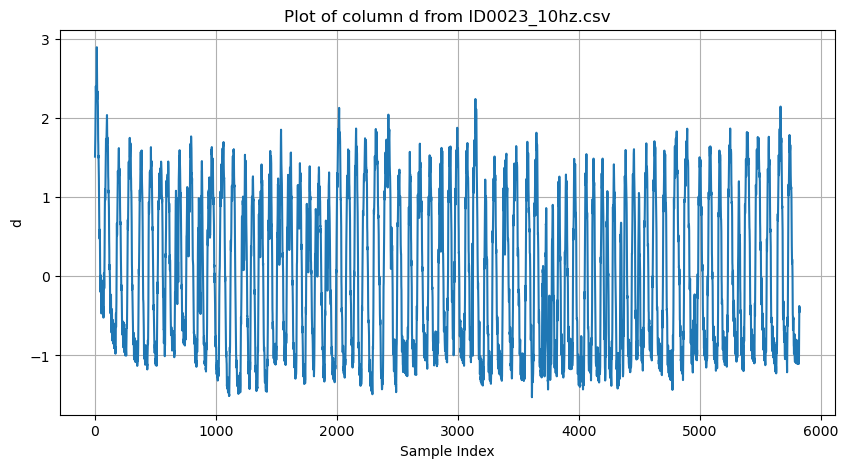

In [13]:
import pandas as pd
import matplotlib.pyplot as plt

# Replace with your actual folder path
file_path = 'Resting_cleaned/ID0001_10hz.csv'

# Load the CSV file
df = pd.read_csv(file_path)

# Plot the 'd' column
plt.figure(figsize=(10, 5))
plt.plot(df['d'])
plt.title('Plot of column d from ID0023_10hz.csv')
plt.xlabel('Sample Index')
plt.ylabel('d')
plt.grid(True)
plt.show()


In [14]:
# Assuming combined_df is your combined DataFrame from previous code

output_file_path = 'id0001_10hz.csv'
combined_df.to_csv(output_file_path, index=False)
print(f"Combined data saved to {output_file_path}")

Combined data saved to id0001_10hz.csv


In [15]:
# Calculate statistics
count = combined_df['d'].count()
mean = combined_df['d'].mean()
min_val = combined_df['d'].min()
max_val = combined_df['d'].max()

print(f"Number of data points: {count}")
print(f"Average (mean) of 'd': {mean}")
print(f"Minimum of 'd': {min_val}")
print(f"Maximum of 'd': {max_val}")

Number of data points: 660002
Average (mean) of 'd': -1.777643348485425e-16
Minimum of 'd': -2.493180501756348
Maximum of 'd': 2.301402448776265


### Corrupted data generation

##### Simulation of missing data 

In [ ]:
import pandas as pd
import numpy as np
import random
import os

# Folder containing your CSV files
folder_path = 'Resting_cleaned'  # Replace with your folder path

# Function to create missing data with specified percentage and gap sizes
def create_missing_data(df, missing_percentage, gap_sizes):
    total_points = len(df)
    missing_points = int(total_points * missing_percentage / 100)
    missing_data_df = df.copy()
    
    gaps_created = 0
    attempts = 0
    max_attempts = 1000  # Avoid infinite loops

    while gaps_created < missing_points and attempts < max_attempts:
        gap_size = random.choice(gap_sizes)
        start_point = random.randint(0, total_points - gap_size - 1)
        
        # Check if this segment already has missing values
        if missing_data_df.loc[start_point:start_point + gap_size - 1, 'd'].isnull().sum() == 0:
            missing_data_df.loc[start_point:start_point + gap_size - 1, 'd'] = np.nan
            gaps_created += gap_size
        
        attempts += 1

    print(f"Created {gaps_created} missing points for {missing_percentage}% missingness.")
    return missing_data_df

# Define missing percentage and gap sizes (example: 10%)
gap_sizes_dict = {
    10: [60, 90],
}

percentages = [10]

# Process all files ending with '_10hz.csv' in the folder
for filename in os.listdir(folder_path):
    if filename.endswith('_10hz.csv'):
        file_path = os.path.join(folder_path, filename)
        df = pd.read_csv(file_path)
        
        for percentage in percentages:
            gap_sizes = gap_sizes_dict[percentage]
            missing_data_df = create_missing_data(df, percentage, gap_sizes)
            
            # Build output filename with _missing suffix before '.csv'
            output_filename = filename.replace('_10hz.csv', f'_10hz_missing.csv')
            output_path = os.path.join(folder_path, output_filename)
            
            missing_data_df.to_csv(output_path, index=False)
            print(f"Saved missing data file: {output_filename}")

print("Missing data generation complete for all _10hz.csv files.")


Created 600 missing points for 10% missingness.
Saved missing data file: ID0025_10hz_missing.csv
Created 660 missing points for 10% missingness.
Saved missing data file: ID0027_10hz_missing.csv
Created 180 missing points for 10% missingness.
Saved missing data file: ID0009_10hz_missing.csv
Created 660 missing points for 10% missingness.
Saved missing data file: ID0029_10hz_missing.csv
Created 600 missing points for 10% missingness.
Saved missing data file: ID0006_10hz_missing.csv
Created 690 missing points for 10% missingness.
Saved missing data file: ID0010_10hz_missing.csv
Created 630 missing points for 10% missingness.
Saved missing data file: ID0028_10hz_missing.csv
Created 690 missing points for 10% missingness.
Saved missing data file: ID0022_10hz_missing.csv
Created 660 missing points for 10% missingness.
Saved missing data file: ID0020_10hz_missing.csv
Created 630 missing points for 10% missingness.
Saved missing data file: ID0003_10hz_missing.csv
Created 870 missing points for

In [7]:
### Plot data

Percentage of missing values: 10.48%


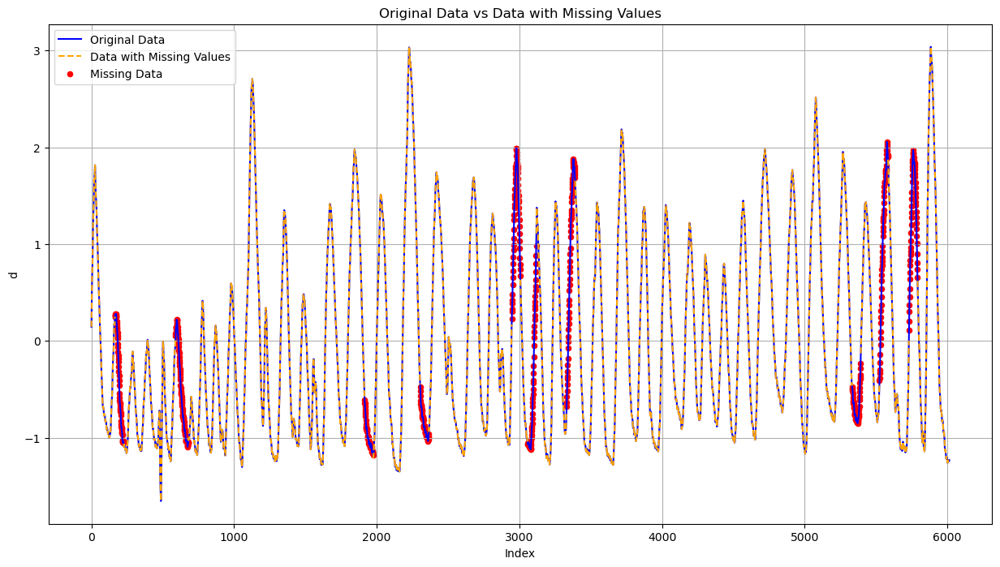

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import os

folder_path = 'Resting_cleaned'  # Folder path

# Load original and missing data files
file_original = os.path.join(folder_path, 'ID0003_10hz.csv')
file_missing = os.path.join(folder_path, 'ID0003_10hz_missing.csv')

# Load data
df_original = pd.read_csv(file_original)
df_missing = pd.read_csv(file_missing)

# Check if there is a datetime column, else use index
# If you have time column (e.g., 'time' or 'timestamp'), use it to plot against
# For now, use index for x-axis
x_original = df_original.index
x_missing = df_missing.index

# Calculate missing percentage
missing_percentage = df_missing['d'].isnull().mean() * 100
print(f"Percentage of missing values: {missing_percentage:.2f}%")

# Plot setup
plt.figure(figsize=(15, 8))

# Plot original data
plt.plot(x_original, df_original['d'], label='Original Data', color='blue')

# Plot missing data with dashed line
plt.plot(x_missing, df_missing['d'], label='Data with Missing Values', color='orange', linestyle='--')

# Highlight missing data points with red dots using original values
missing_areas = df_missing['d'].isnull()
plt.scatter(x_missing[missing_areas], df_original.loc[missing_areas, 'd'], color='red', label='Missing Data', s=20)

# Customize plot
plt.xlabel('Index')
plt.ylabel('d')
plt.title('Original Data vs Data with Missing Values')
plt.legend()
plt.grid(True)

# Show plot
plt.show()


##### Adding gausian noise to mimic corrupt data

In [25]:
import os
import numpy as np
import pandas as pd

folder_path = "Resting_cleaned"  # Folder path where files reside

np.random.seed(2)  # Optional for reproducibility


def local_stats(signal, start, end, window=100):
    n = len(signal)
    left_start = max(0, start - window)
    left = signal[left_start:start]
    right_end = min(n, end + window)
    right = signal[end:right_end]

    neighbors = np.concatenate([left[~np.isnan(left)], right[~np.isnan(right)]])
    if len(neighbors) == 0:
        return 0.0, 1.0
    std_val = np.std(neighbors)
    return np.mean(neighbors), std_val if std_val > 0 else 1.0


def generate_motion_corrupted_segment(
    seg_len,
    left_val,
    right_val,
    base_mean,
    base_std,
    movement_type=None,
    global_min=None,
    global_max=None,
    amp_scale=0.5,        # <--- scale amplitude here (0.3–0.7 tends to be modest)
):
    """
    Generate a segment that approximates breathing but with motion artifacts.
    """

    if seg_len <= 1:
        seg = np.full(seg_len, base_mean, dtype=float)
        if global_min is not None and global_max is not None:
            seg = np.clip(seg, global_min, global_max)
        return seg

    x = np.linspace(0, 1, seg_len)

    # Base breathing-like wave using neighbors as trend
    baseline = (1 - x) * left_val + x * right_val

    num_cycles = np.random.choice([1, 2, 3], p=[0.5, 0.3, 0.2])
    phase = np.random.uniform(0, 2 * np.pi)
    sine = np.sin(2 * np.pi * num_cycles * x + phase)

    # Amplitude scaled by local std and external scale factor
    amp = amp_scale * np.random.uniform(0.8, 1.2) * max(base_std, 0.1)
    wave = baseline + amp * sine

    if movement_type is None:
        movement_type = np.random.choice(
            ["baseline_shift", "amplitude_drop", "phase_drift", "flat_noise"],
            p=[0.35, 0.25, 0.25, 0.15]
        )

    if movement_type == "baseline_shift":
        jump_idx = np.random.randint(seg_len // 4, 3 * seg_len // 4)
        # keep jump magnitude modest
        jump_mag = np.random.uniform(0.2, 0.8) * base_std
        wave[jump_idx:] += jump_mag

    elif movement_type == "amplitude_drop":
        drop_start = np.random.randint(0, max(1, seg_len // 2))
        drop_end = np.random.randint(drop_start + max(1, seg_len // 4), seg_len)
        if drop_end <= drop_start:
            drop_end = min(seg_len, drop_start + 1)

        factor = np.random.uniform(0.2, 0.6)
        local_baseline = baseline[drop_start:drop_end]
        local_wave = wave[drop_start:drop_end]
        wave[drop_start:drop_end] = local_baseline + factor * (local_wave - local_baseline)

    elif movement_type == "phase_drift":
        drift = np.linspace(0, np.random.uniform(0.5 * np.pi, 1.0 * np.pi), seg_len)
        sine_drift = np.sin(2 * np.pi * num_cycles * x + phase + drift)
        wave = baseline + amp * sine_drift

    elif movement_type == "flat_noise":
        slope = np.random.uniform(-0.1, 0.1) * base_std
        flat_baseline = base_mean + slope * (x - 0.5) * seg_len
        noise = np.random.normal(0, 0.15 * base_std, seg_len)
        wave = flat_baseline + noise

    # Add small extra noise to all variants
    noise = np.random.normal(0, 0.03 * max(base_std, 0.1), seg_len)
    wave = wave + noise

    # Enforce global min/max bounds
    if global_min is not None and global_max is not None:
        wave = np.clip(wave, global_min, global_max)

    return wave


def corrupt_missing_data(df, col="d", global_min=None, global_max=None):
    """
    Replace NaN regions in df[col] with wave-like segments
    corrupted by motion-like artifacts, clipped to [global_min, global_max].
    """

    corrupted_df = df.copy()
    data = corrupted_df[col].values.astype(float)

    is_missing = pd.isnull(data)
    output = data.copy()
    n = len(data)
    i = 0

    while i < n:
        if is_missing[i]:
            start = i
            while i < n and is_missing[i]:
                i += 1
            end = i
            seg_len = end - start

            if start - 1 >= 0 and not np.isnan(output[start - 1]):
                left_val = output[start - 1]
            else:
                left_val = output[end] if end < n and not np.isnan(output[end]) else 0.0

            if end < n and not np.isnan(output[end]):
                right_val = output[end]
            else:
                right_val = left_val

            base_mean, base_std = local_stats(output, start, end, window=200)

            movement_type = np.random.choice(
                ["baseline_shift", "amplitude_drop", "phase_drift", "flat_noise"],
                p=[0.35, 0.25, 0.25, 0.15]
            )

            corrupted_segment = generate_motion_corrupted_segment(
                seg_len,
                left_val,
                right_val,
                base_mean,
                base_std,
                movement_type=movement_type,
                global_min=global_min,
                global_max=global_max,
            )

            output[start:end] = corrupted_segment
        else:
            i += 1

    corrupted_df[col] = output
    return corrupted_df


if __name__ == "__main__":
    # Compute global min/max over all missing files (or over some reference clean set)
    all_vals = []
    for filename in os.listdir(folder_path):
        if filename.endswith("_10hz_missing.csv"):
            file_path = os.path.join(folder_path, filename)
            df_tmp = pd.read_csv(file_path)
            vals = df_tmp["d"].values.astype(float)
            vals = vals[~np.isnan(vals)]
            if len(vals) > 0:
                all_vals.append(vals)
    if len(all_vals) > 0:
        all_vals = np.concatenate(all_vals)
        global_min = np.min(all_vals)
        global_max = np.max(all_vals)
    else:
        global_min, global_max = None, None

    for filename in os.listdir(folder_path):
        if filename.endswith("_10hz_missing.csv"):
            file_path = os.path.join(folder_path, filename)
            df_missing = pd.read_csv(file_path)

            corrupted_df = corrupt_missing_data(
                df_missing,
                col="d",
                global_min=global_min,
                global_max=global_max,
            )

            output_filename = filename.replace(
                "_10hz_missing.csv", "_10hz_missing_corrupt.csv"
            )
            output_path = os.path.join(folder_path, output_filename)
            corrupted_df.to_csv(output_path, index=False)
            print(f"Saved corrupted missing data: {output_filename}")

    print("Corrupted missing data generation complete.")


Saved corrupted missing data: ID0009_10hz_missing_corrupt.csv
Saved corrupted missing data: ID0014_10hz_missing_corrupt.csv
Saved corrupted missing data: ID0011_10hz_missing_corrupt.csv
Saved corrupted missing data: ID0008_10hz_missing_corrupt.csv
Saved corrupted missing data: ID0022_10hz_missing_corrupt.csv
Saved corrupted missing data: ID0017_10hz_missing_corrupt.csv
Saved corrupted missing data: ID0019_10hz_missing_corrupt.csv
Saved corrupted missing data: ID0015_10hz_missing_corrupt.csv
Saved corrupted missing data: ID0026_10hz_missing_corrupt.csv
Saved corrupted missing data: ID0001_10hz_missing_corrupt.csv
Saved corrupted missing data: ID0020_10hz_missing_corrupt.csv
Saved corrupted missing data: ID0005_10hz_missing_corrupt.csv
Saved corrupted missing data: ID0013_10hz_missing_corrupt.csv
Saved corrupted missing data: ID0016_10hz_missing_corrupt.csv
Saved corrupted missing data: ID0030_10hz_missing_corrupt.csv
Saved corrupted missing data: ID0023_10hz_missing_corrupt.csv
Saved co

#### Original vs corrupted data

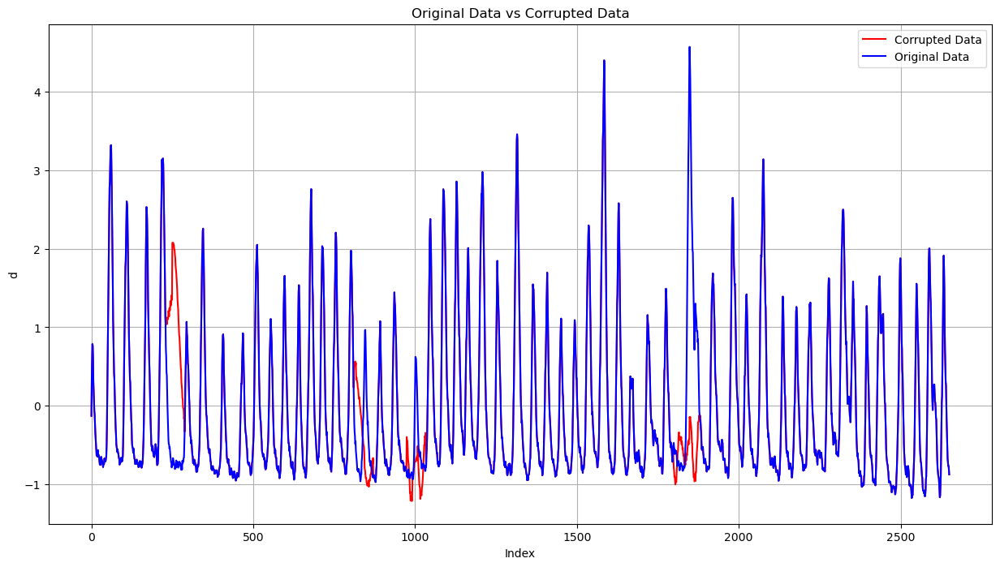

In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import os

folder_path = 'Resting_cleaned'  # Folder path

file_original = os.path.join(folder_path, 'ID0002_10hz.csv')
file_corrupted = os.path.join(folder_path, 'ID0002_10hz_missing_corrupt.csv')

df_original = pd.read_csv(file_original)
df_corrupted = pd.read_csv(file_corrupted)

plt.figure(figsize=(15, 8))
plt.plot(df_corrupted.index, df_corrupted['d'], label='Corrupted Data', color='red')
plt.plot(df_original.index, df_original['d'], label='Original Data', color='blue')


plt.xlabel('Index')
plt.ylabel('d')
plt.title('Original Data vs Corrupted Data')
plt.legend()
plt.grid(True)
plt.show()


### Reconstruction

##### Mean imputation

In [13]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt

folder_path = 'Resting_cleaned'  # Folder path

def iterative_mean_imputation(df):
    df['mean'] = df['d'].copy()
    for i in range(len(df)):
        if pd.isna(df.at[i, 'mean']):
            if i == 0:
                # For first value if NaN, set to zero or first non-NaN value can be handled differently
                df.at[i, 'mean'] = 0
            else:
                mean_so_far = df['mean'][:i].mean()
                df.at[i, 'mean'] = mean_so_far
    return df

for filename in os.listdir(folder_path):
    if filename.endswith('_10hz_missing.csv'):
        file_path = os.path.join(folder_path, filename)
        print(f"Processing {filename}...")

        # Load missing data file
        df = pd.read_csv(file_path)

        # Perform iterative mean imputation
        df = iterative_mean_imputation(df)

        # Save imputed result with new suffix
        output_filename = filename.replace('_10hz_missing.csv', '_10hz_reconstructed_mean.csv')
        output_path = os.path.join(folder_path, output_filename)
        df.to_csv(output_path, index=False)
        print(f"Saved reconstructed file: {output_filename}")


Processing ID0009_10hz_missing.csv...
Saved reconstructed file: ID0009_10hz_reconstructed_mean.csv
Processing ID0014_10hz_missing.csv...
Saved reconstructed file: ID0014_10hz_reconstructed_mean.csv
Processing ID0011_10hz_missing.csv...
Saved reconstructed file: ID0011_10hz_reconstructed_mean.csv
Processing ID0008_10hz_missing.csv...
Saved reconstructed file: ID0008_10hz_reconstructed_mean.csv
Processing ID0022_10hz_missing.csv...
Saved reconstructed file: ID0022_10hz_reconstructed_mean.csv
Processing ID0017_10hz_missing.csv...
Saved reconstructed file: ID0017_10hz_reconstructed_mean.csv
Processing ID0019_10hz_missing.csv...
Saved reconstructed file: ID0019_10hz_reconstructed_mean.csv
Processing ID0015_10hz_missing.csv...
Saved reconstructed file: ID0015_10hz_reconstructed_mean.csv
Processing ID0026_10hz_missing.csv...
Saved reconstructed file: ID0026_10hz_reconstructed_mean.csv
Processing ID0001_10hz_missing.csv...
Saved reconstructed file: ID0001_10hz_reconstructed_mean.csv
Processing

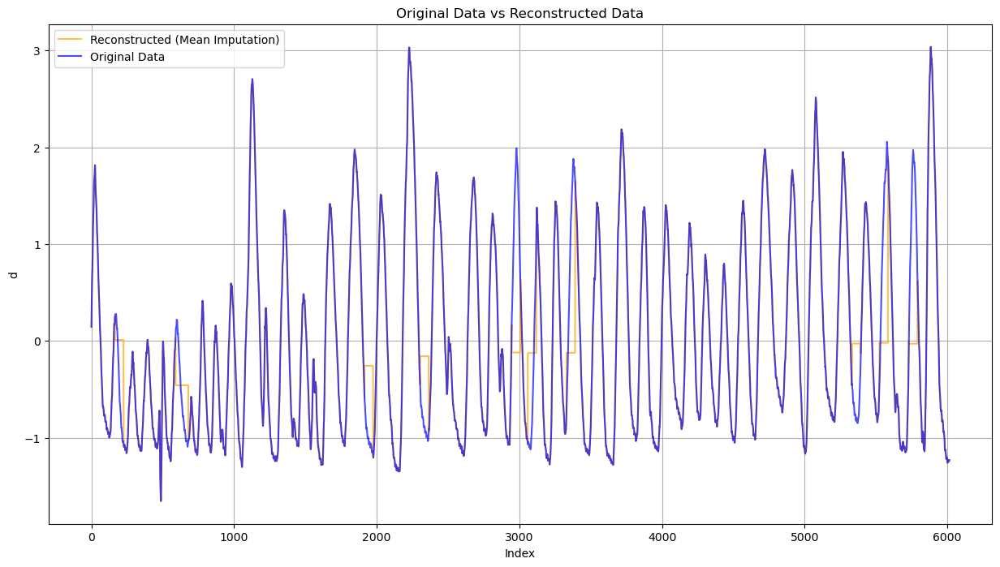

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import os

folder_path = 'Resting_cleaned'  # Folder path

# Load original data
file_original = os.path.join(folder_path, 'ID0003_10hz.csv')
df_original = pd.read_csv(file_original)

# Load missing data with mean imputation
file_missing = os.path.join(folder_path, 'ID0003_10hz_reconstructed_mean.csv')
df_missing = pd.read_csv(file_missing)

# Plot both
plt.figure(figsize=(15, 8))

# Mean imputed missing data 'mean'
plt.plot(df_missing.index, df_missing['mean'], label='Reconstructed (Mean Imputation)', color='orange', alpha=0.7)

# Original data 'd'
plt.plot(df_original.index, df_original['d'], label='Original Data', color='blue', alpha=0.7)


plt.xlabel('Index')
plt.ylabel('d')
plt.title('Original Data vs Reconstructed Data')
plt.legend()
plt.grid(True)
plt.show()


#### LSTM

In [16]:
import pandas as pd
import numpy as np
import os
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

folder_path = 'Resting_cleaned'
sequence_length = 30          # CHANGED
max_iterations = 10


def create_sequences(data, seq_length):
    sequences = []
    for i in range(len(data) - seq_length + 1):
        sequences.append(data[i:i + seq_length])
    return np.array(sequences)


for filename in os.listdir(folder_path):
    if filename.endswith('_10hz_missing.csv'):
        print(f"Processing {filename}...")
        file_path = os.path.join(folder_path, filename)
        df = pd.read_csv(file_path)

        scaler = MinMaxScaler(feature_range=(0, 1))
        df['d_scaled'] = scaler.fit_transform(df[['d']])

        non_nan_data = df['d_scaled'].dropna().values
        if len(non_nan_data) < sequence_length:
            print(f"Not enough data to create sequences in {filename}, skipping.")
            continue

        X_full = create_sequences(non_nan_data, sequence_length)
        X = X_full[:, :-1]      # first 29 as input
        y = X_full[:, -1]       # last as target

        X_reshaped = np.reshape(X, (X.shape[0], X.shape[1], 1))  # [samples, 29, 1]

        lstm_model = Sequential()
        lstm_model.add(
            LSTM(
                50,
                return_sequences=True,
                input_shape=(sequence_length - 1, 1)  # (29, 1) CHANGED
            )
        )
        lstm_model.add(LSTM(50))
        lstm_model.add(Dense(1))
        lstm_model.compile(loss='mean_squared_error', optimizer='adam')

        lstm_model.fit(X_reshaped, y, epochs=60, batch_size=32, verbose=1)

        for iteration in range(max_iterations):
            missing_before = df['d'].isna().sum()

            for i in range(len(df)):
                if pd.isna(df.at[i, 'd']):
                    past_vals = df['d_scaled'].iloc[max(0, i - sequence_length + 1):i].dropna().values
                    if len(past_vals) < sequence_length - 1:   # need 29 past values
                        if len(past_vals) == 0:
                            continue
                        past_vals = np.pad(
                            past_vals,
                            (sequence_length - 1 - len(past_vals), 0),
                            'constant',
                            constant_values=past_vals[0]
                        )
                    input_seq = np.reshape(past_vals, (1, sequence_length - 1, 1))  # (1, 29, 1)
                    pred_scaled = lstm_model.predict(input_seq, verbose=0)
                    pred_value = scaler.inverse_transform(pred_scaled.reshape(-1, 1))[0][0]
                    df.at[i, 'd'] = pred_value
                    df.at[i, 'd_scaled'] = scaler.transform([[pred_value]])[0][0]

            missing_after = df['d'].isna().sum()
            print(f"Iteration {iteration + 1}: Missing values remaining = {missing_after}")
            if missing_after == 0 or missing_after == missing_before:
                break

        df.drop(columns=['d_scaled'], inplace=True)

        output_filename = filename.replace('_10hz_missing.csv', '_10hz_lstm.csv')
        output_path = os.path.join(folder_path, output_filename)
        df.to_csv(output_path, index=False)
        print(f"{output_filename} saved successfully!\n")


Processing ID0009_10hz_missing.csv...
Epoch 1/60


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0282
Epoch 2/60
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0085
Epoch 3/60
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0035
Epoch 4/60
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0028
Epoch 5/60
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0026
Epoch 6/60
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0024
Epoch 7/60
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0022
Epoch 8/60
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0022
Epoch 9/60
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0020
Epoch 10/60
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019
Epoch 11/60
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017
Epoch 12/60
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0020
Epoch 13/60
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016
Epoch 14/60
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016
Epoch 15/60
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
Epoch 16/60
38/38 ━━━━━━━━

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0009_10hz_lstm.csv saved successfully!

Processing ID0014_10hz_missing.csv...
Epoch 1/60
163/163 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0167
Epoch 2/60
163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0027
Epoch 3/60
163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0020
Epoch 4/60
163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0017
Epoch 5/60
163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0017
Epoch 6/60
163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0013
Epoch 7/60
163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0013
Epoch 8/60
163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0011
Epoch 9/60
163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 8.6194e-04
Epoch 10/60
163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 8.0644e-04
Epoch 11/60
163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 6.7132e-04
Epoch 12/60
163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 6.8387e-04
Epoch 13/60
163/163 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - 

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0014_10hz_lstm.csv saved successfully!

Processing ID0011_10hz_missing.csv...
Epoch 1/60


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


167/167 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0242
Epoch 2/60
167/167 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0062
Epoch 3/60
167/167 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0039
Epoch 4/60
167/167 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0025
Epoch 5/60
167/167 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0022
Epoch 6/60
167/167 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0021
Epoch 7/60
167/167 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0020
Epoch 8/60
167/167 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0019
Epoch 9/60
167/167 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0021
Epoch 10/60
167/167 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0019
Epoch 11/60
167/167 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0019
Epoch 12/60
167/167 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0018
Epoch 13/60
167/167 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0017
Epoch 14/60
167/167 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0019
Epoch 15/60
167/167 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0018


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0011_10hz_lstm.csv saved successfully!

Processing ID0008_10hz_missing.csv...
Epoch 1/60
169/169 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0142
Epoch 2/60
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0023
Epoch 3/60
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0017
Epoch 4/60
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0012
Epoch 5/60
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0010
Epoch 6/60
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 7.7888e-04
Epoch 7/60
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 6.3404e-04
Epoch 8/60
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 5.7499e-04
Epoch 9/60
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 5.4429e-04
Epoch 10/60
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 5.1092e-04
Epoch 11/60
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 4.9064e-04
Epoch 12/60
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 4.8577e-04
Epoch 13/60
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0008_10hz_lstm.csv saved successfully!

Processing ID0022_10hz_missing.csv...
Epoch 1/60


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.0142
Epoch 2/60
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0029
Epoch 3/60
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0020
Epoch 4/60
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0013
Epoch 5/60
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 8.0498e-04
Epoch 6/60
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 6.6492e-04
Epoch 7/60
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 5.4078e-04
Epoch 8/60
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 5.2795e-04
Epoch 9/60
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 4.4778e-04
Epoch 10/60
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 4.8843e-04
Epoch 11/60
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 4.3215e-04
Epoch 12/60
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 4.2610e-04
Epoch 13/60
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 4.2650e-04
Epoch 14/60
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 4.1567e-04
Epoch 15/60
182/182 ━━━━━━━━

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0022_10hz_lstm.csv saved successfully!

Processing ID0017_10hz_missing.csv...
Epoch 1/60


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


91/91 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0314
Epoch 2/60
91/91 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0072
Epoch 3/60
91/91 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0043
Epoch 4/60
91/91 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0039
Epoch 5/60
91/91 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0034
Epoch 6/60
91/91 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0030
Epoch 7/60
91/91 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0025
Epoch 8/60
91/91 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0023
Epoch 9/60
91/91 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0017
Epoch 10/60
91/91 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0017
Epoch 11/60
91/91 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0011
Epoch 12/60
91/91 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0011
Epoch 13/60
91/91 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 8.6883e-04
Epoch 14/60
91/91 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 7.8265e-04
Epoch 15/60
91/91 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 7.3118e-04
Epoch 16/60
91/91 

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0017_10hz_lstm.csv saved successfully!

Processing ID0019_10hz_missing.csv...
Epoch 1/60


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


166/166 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0092
Epoch 2/60
166/166 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0024
Epoch 3/60
166/166 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0018
Epoch 4/60
166/166 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0014
Epoch 5/60
166/166 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 9.8521e-04
Epoch 6/60
166/166 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 8.2150e-04
Epoch 7/60
166/166 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 7.1292e-04
Epoch 8/60
166/166 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 6.7349e-04
Epoch 9/60
166/166 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 6.6802e-04
Epoch 10/60
166/166 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 5.9125e-04
Epoch 11/60
166/166 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 5.8591e-04
Epoch 12/60
166/166 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 6.2758e-04
Epoch 13/60
166/166 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 5.8166e-04
Epoch 14/60
166/166 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 5.6973e-04
Epoch 15/60
166/166 ━━━━━━━━

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0019_10hz_lstm.csv saved successfully!

Processing ID0015_10hz_missing.csv...
Epoch 1/60


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


182/182 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0095
Epoch 2/60
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0015
Epoch 3/60
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 9.6216e-04
Epoch 4/60
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 7.3447e-04
Epoch 5/60
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 5.9739e-04
Epoch 6/60
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 5.6893e-04
Epoch 7/60
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 4.5355e-04
Epoch 8/60
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 4.1344e-04
Epoch 9/60
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.7455e-04
Epoch 10/60
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 3.4744e-04
Epoch 11/60
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 3.6560e-04
Epoch 12/60
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 3.2433e-04
Epoch 13/60
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 3.1516e-04
Epoch 14/60
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 3.1103e-04
Epoch 15/60
182/182

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0015_10hz_lstm.csv saved successfully!

Processing ID0026_10hz_missing.csv...
Epoch 1/60
226/226 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0142
Epoch 2/60
226/226 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0023
Epoch 3/60
226/226 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0012
Epoch 4/60
226/226 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 9.3520e-04
Epoch 5/60
226/226 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 7.1182e-04
Epoch 6/60
226/226 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 6.8599e-04
Epoch 7/60
226/226 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 6.3123e-04
Epoch 8/60
226/226 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 5.7727e-04
Epoch 9/60
226/226 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 5.5973e-04
Epoch 10/60
226/226 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 5.4244e-04
Epoch 11/60
226/226 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 5.3173e-04
Epoch 12/60
226/226 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 5.2801e-04
Epoch 13/60
226/226 ━━━━━━━━━━━━━━━

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0026_10hz_lstm.csv saved successfully!

Processing ID0001_10hz_missing.csv...
Epoch 1/60


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


162/162 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0131
Epoch 2/60
162/162 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0039
Epoch 3/60
162/162 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0030
Epoch 4/60
162/162 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0027
Epoch 5/60
162/162 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0022
Epoch 6/60
162/162 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0017
Epoch 7/60
162/162 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0011
Epoch 8/60
162/162 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0010    
Epoch 9/60
162/162 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 8.8702e-04
Epoch 10/60
162/162 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 7.7094e-04
Epoch 11/60
162/162 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 7.8430e-04
Epoch 12/60
162/162 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 7.5879e-04
Epoch 13/60
162/162 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 7.3793e-04
Epoch 14/60
162/162 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 7.4465e-04
Epoch 15/60
162/162 ━━━━━━━━━━━━━━━━━━━━

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0001_10hz_lstm.csv saved successfully!

Processing ID0020_10hz_missing.csv...
Epoch 1/60


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


179/179 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0111
Epoch 2/60
179/179 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0023
Epoch 3/60
179/179 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0016
Epoch 4/60
179/179 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0012
Epoch 5/60
179/179 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 9.8177e-04
Epoch 6/60
179/179 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 8.9262e-04
Epoch 7/60
179/179 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 7.3563e-04
Epoch 8/60
179/179 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 6.4796e-04
Epoch 9/60
179/179 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 6.3282e-04
Epoch 10/60
179/179 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 6.0611e-04
Epoch 11/60
179/179 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 5.6915e-04
Epoch 12/60
179/179 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 5.5492e-04
Epoch 13/60
179/179 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 5.2373e-04
Epoch 14/60
179/179 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 5.3172e-04
Epoch 15/60
179/179 ━━━━━━━━

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0020_10hz_lstm.csv saved successfully!

Processing ID0005_10hz_missing.csv...
Epoch 1/60
164/164 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0140
Epoch 2/60
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0028
Epoch 3/60
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0019
Epoch 4/60
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0015
Epoch 5/60
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0011
Epoch 6/60
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 8.8468e-04
Epoch 7/60
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 7.5540e-04
Epoch 8/60
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 6.5451e-04
Epoch 9/60
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 6.2634e-04
Epoch 10/60
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 6.0880e-04
Epoch 11/60
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 5.4639e-04
Epoch 12/60
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 5.4382e-04
Epoch 13/60
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0005_10hz_lstm.csv saved successfully!

Processing ID0013_10hz_missing.csv...
Epoch 1/60


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


192/192 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.0107
Epoch 2/60
192/192 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0018
Epoch 3/60
192/192 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0011
Epoch 4/60
192/192 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 8.1884e-04
Epoch 5/60
192/192 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 6.8633e-04
Epoch 6/60
192/192 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 6.5724e-04
Epoch 7/60
192/192 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 6.3821e-04
Epoch 8/60
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 5.4452e-04
Epoch 9/60
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 5.8786e-04
Epoch 10/60
192/192 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 5.4722e-04
Epoch 11/60
192/192 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 5.2063e-04
Epoch 12/60
192/192 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 5.2531e-04
Epoch 13/60
192/192 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 5.1862e-04
Epoch 14/60
192/192 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 5.0873e-04
Epoch 15/60
192/192 ━━━━

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0013_10hz_lstm.csv saved successfully!

Processing ID0016_10hz_missing.csv...
Epoch 1/60
149/149 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0190
Epoch 2/60
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0041
Epoch 3/60
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0022
Epoch 4/60
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0016
Epoch 5/60
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0014
Epoch 6/60
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0012
Epoch 7/60
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0012
Epoch 8/60
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0011
Epoch 9/60
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0010
Epoch 10/60
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0011
Epoch 11/60
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0011
Epoch 12/60
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0010    
Epoch 13/60
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0010

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0016_10hz_lstm.csv saved successfully!

Processing ID0030_10hz_missing.csv...
Epoch 1/60


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


113/113 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0038
Epoch 2/60
113/113 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 8.0035e-04
Epoch 3/60
113/113 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 4.7402e-04
Epoch 4/60
113/113 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 3.6494e-04
Epoch 5/60
113/113 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 2.9056e-04
Epoch 6/60
113/113 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 2.6131e-04
Epoch 7/60
113/113 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 2.3213e-04
Epoch 8/60
113/113 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.7938e-04
Epoch 9/60
113/113 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.6043e-04
Epoch 10/60
113/113 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.4398e-04
Epoch 11/60
113/113 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.3364e-04
Epoch 12/60
113/113 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.0296e-04
Epoch 13/60
113/113 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 9.5978e-05
Epoch 14/60
113/113 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 9.5963e-05
Epoch 15/60
113/

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0030_10hz_lstm.csv saved successfully!

Processing ID0023_10hz_missing.csv...
Epoch 1/60
188/188 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0131
Epoch 2/60
188/188 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0025
Epoch 3/60
188/188 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0022
Epoch 4/60
188/188 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0019
Epoch 5/60
188/188 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0016
Epoch 6/60
188/188 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0013
Epoch 7/60
188/188 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 9.1826e-04
Epoch 8/60
188/188 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 8.0401e-04
Epoch 9/60
188/188 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 6.8269e-04
Epoch 10/60
188/188 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 6.1003e-04
Epoch 11/60
188/188 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 6.1782e-04
Epoch 12/60
188/188 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 5.6238e-04
Epoch 13/60
188/188 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0023_10hz_lstm.csv saved successfully!

Processing ID0024_10hz_missing.csv...
Epoch 1/60


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


166/166 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0151
Epoch 2/60
166/166 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0035
Epoch 3/60
166/166 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0025
Epoch 4/60
166/166 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0020
Epoch 5/60
166/166 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0014
Epoch 6/60
166/166 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0010
Epoch 7/60
166/166 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 9.4972e-04
Epoch 8/60
166/166 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 8.8405e-04
Epoch 9/60
166/166 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 8.6497e-04
Epoch 10/60
166/166 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 8.2090e-04
Epoch 11/60
166/166 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 8.0213e-04
Epoch 12/60
166/166 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 7.9143e-04
Epoch 13/60
166/166 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 7.8352e-04
Epoch 14/60
166/166 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 7.2654e-04
Epoch 15/60
166/166 ━━━━━━━━━━━━━━━━

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0024_10hz_lstm.csv saved successfully!

Processing ID0003_10hz_missing.csv...
Epoch 1/60


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


168/168 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0063
Epoch 2/60
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0012
Epoch 3/60
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 9.2896e-04
Epoch 4/60
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 7.8879e-04
Epoch 5/60
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 6.8308e-04
Epoch 6/60
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 5.8186e-04
Epoch 7/60
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 5.1227e-04
Epoch 8/60
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 4.5548e-04
Epoch 9/60
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 4.1609e-04
Epoch 10/60
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 3.9226e-04
Epoch 11/60
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 3.7498e-04
Epoch 12/60
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 3.2365e-04
Epoch 13/60
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 3.1418e-04
Epoch 14/60
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 3.0637e-04
Epoch 15/60
168/168 

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0003_10hz_lstm.csv saved successfully!

Processing ID0025_10hz_missing.csv...
Epoch 1/60


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


142/142 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0155
Epoch 2/60
142/142 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0056
Epoch 3/60
142/142 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0049
Epoch 4/60
142/142 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0047
Epoch 5/60
142/142 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0043
Epoch 6/60
142/142 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0038
Epoch 7/60
142/142 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0031
Epoch 8/60
142/142 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0022
Epoch 9/60
142/142 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0018
Epoch 10/60
142/142 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0017
Epoch 11/60
142/142 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0017
Epoch 12/60
142/142 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0017
Epoch 13/60
142/142 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0016
Epoch 14/60
142/142 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0016
Epoch 15/60
142/142 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0015


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0025_10hz_lstm.csv saved successfully!

Processing ID0012_10hz_missing.csv...
Epoch 1/60
146/146 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0103
Epoch 2/60
146/146 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0023
Epoch 3/60
146/146 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0018
Epoch 4/60
146/146 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0016
Epoch 5/60
146/146 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0014
Epoch 6/60
146/146 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0012
Epoch 7/60
146/146 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 8.5488e-04
Epoch 8/60
146/146 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 5.8707e-04
Epoch 9/60
146/146 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 4.4884e-04
Epoch 10/60
146/146 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 5.3142e-04
Epoch 11/60
146/146 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 4.3958e-04
Epoch 12/60
146/146 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 4.2766e-04
Epoch 13/60
146/146 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0012_10hz_lstm.csv saved successfully!

Processing ID0029_10hz_missing.csv...
Epoch 1/60


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


168/168 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0161
Epoch 2/60
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0021
Epoch 3/60
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0016
Epoch 4/60
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0013
Epoch 5/60
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0012
Epoch 6/60
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 8.4659e-04
Epoch 7/60
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 6.7943e-04
Epoch 8/60
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 5.1735e-04
Epoch 9/60
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 4.9289e-04
Epoch 10/60
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 3.8071e-04
Epoch 11/60
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 3.6850e-04
Epoch 12/60
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 3.6582e-04
Epoch 13/60
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 3.3216e-04
Epoch 14/60
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 3.2320e-04
Epoch 15/60
168/168 ━━━━━━━━━━━━

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0029_10hz_lstm.csv saved successfully!

Processing ID0004_10hz_missing.csv...
Epoch 1/60
124/124 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0223
Epoch 2/60
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0042
Epoch 3/60
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0032
Epoch 4/60
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0026
Epoch 5/60
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0025
Epoch 6/60
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0020
Epoch 7/60
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0018
Epoch 8/60
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0015
Epoch 9/60
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0011
Epoch 10/60
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 9.0545e-04
Epoch 11/60
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 7.7646e-04
Epoch 12/60
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 7.4188e-04
Epoch 13/60
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0004_10hz_lstm.csv saved successfully!

Processing ID0028_10hz_missing.csv...
Epoch 1/60


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


164/164 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0078
Epoch 2/60
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0014
Epoch 3/60
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0011    
Epoch 4/60
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 8.8304e-04
Epoch 5/60
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 7.2272e-04
Epoch 6/60
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 6.5535e-04
Epoch 7/60
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 5.5093e-04
Epoch 8/60
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 5.5152e-04
Epoch 9/60
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 4.6807e-04
Epoch 10/60
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 4.2784e-04
Epoch 11/60
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.9000e-04
Epoch 12/60
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.8813e-04
Epoch 13/60
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 3.6595e-04
Epoch 14/60
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.6358e-04
Epoch 15/60
164/164 

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0028_10hz_lstm.csv saved successfully!

Processing ID0027_10hz_missing.csv...
Epoch 1/60


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


173/173 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0103
Epoch 2/60
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0017
Epoch 3/60
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0016
Epoch 4/60
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0015
Epoch 5/60
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0014
Epoch 6/60
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0013
Epoch 7/60
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0011
Epoch 8/60
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0010
Epoch 9/60
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 7.9332e-04
Epoch 10/60
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 5.6836e-04
Epoch 11/60
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 4.3255e-04
Epoch 12/60
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 4.3523e-04
Epoch 13/60
173/173 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 4.2438e-04
Epoch 14/60
173/173 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 3.5287e-04
Epoch 15/60
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0027_10hz_lstm.csv saved successfully!

Processing ID0018_10hz_missing.csv...
Epoch 1/60
141/141 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0085
Epoch 2/60
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0025
Epoch 3/60
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0017
Epoch 4/60
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0012
Epoch 5/60
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 8.9015e-04
Epoch 6/60
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 7.0274e-04
Epoch 7/60
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 6.0503e-04
Epoch 8/60
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 5.8819e-04
Epoch 9/60
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 5.6620e-04
Epoch 10/60
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 5.8366e-04
Epoch 11/60
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 4.9383e-04
Epoch 12/60
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 5.1341e-04
Epoch 13/60
141/141 ━━━━━━━━━━━━━━━━━━━

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0018_10hz_lstm.csv saved successfully!

Processing ID0002_10hz_missing.csv...
Epoch 1/60


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


74/74 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0157
Epoch 2/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0044
Epoch 3/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0023
Epoch 4/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0015
Epoch 5/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0013
Epoch 6/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0010
Epoch 7/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 8.1290e-04
Epoch 8/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 7.2522e-04
Epoch 9/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 6.3257e-04
Epoch 10/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 5.5463e-04
Epoch 11/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 5.1793e-04
Epoch 12/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 4.3480e-04
Epoch 13/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 4.6303e-04
Epoch 14/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 4.1648e-04
Epoch 15/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 4.194

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0002_10hz_lstm.csv saved successfully!

Processing ID0007_10hz_missing.csv...
Epoch 1/60


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


174/174 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0082
Epoch 2/60
174/174 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0017
Epoch 3/60
174/174 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0013
Epoch 4/60
174/174 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0011
Epoch 5/60
174/174 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 9.8977e-04
Epoch 6/60
174/174 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 8.3953e-04
Epoch 7/60
174/174 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 6.8934e-04
Epoch 8/60
174/174 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 6.4001e-04
Epoch 9/60
174/174 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 5.2355e-04
Epoch 10/60
174/174 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 4.4934e-04
Epoch 11/60
174/174 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 4.4450e-04
Epoch 12/60
174/174 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 4.2228e-04
Epoch 13/60
174/174 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 3.9007e-04
Epoch 14/60
174/174 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 4.0182e-04
Epoch 15/60
174/174 ━━━━━━━━

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0007_10hz_lstm.csv saved successfully!

Processing ID0021_10hz_missing.csv...
Epoch 1/60
169/169 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0228
Epoch 2/60
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0022
Epoch 3/60
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0018
Epoch 4/60
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0017
Epoch 5/60
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0015
Epoch 6/60
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0014
Epoch 7/60
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0012
Epoch 8/60
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0012
Epoch 9/60
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0010    
Epoch 10/60
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 8.5885e-04
Epoch 11/60
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 6.7792e-04
Epoch 12/60
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 5.9906e-04
Epoch 13/60
169/169 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - 

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0021_10hz_lstm.csv saved successfully!

Processing ID0006_10hz_missing.csv...
Epoch 1/60


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


165/165 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0186
Epoch 2/60
165/165 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0046
Epoch 3/60
165/165 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0024
Epoch 4/60
165/165 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0022
Epoch 5/60
165/165 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0021
Epoch 6/60
165/165 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0019
Epoch 7/60
165/165 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0018
Epoch 8/60
165/165 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0018
Epoch 9/60
165/165 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0018
Epoch 10/60
165/165 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0018
Epoch 11/60
165/165 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0018
Epoch 12/60
165/165 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0018
Epoch 13/60
165/165 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0018
Epoch 14/60
165/165 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0018
Epoch 15/60
165/165 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0018


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0006_10hz_lstm.csv saved successfully!

Processing ID0010_10hz_missing.csv...
Epoch 1/60
171/171 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0217
Epoch 2/60
171/171 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0041
Epoch 3/60
171/171 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0030
Epoch 4/60
171/171 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0019
Epoch 5/60
171/171 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0015
Epoch 6/60
171/171 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0012
Epoch 7/60
171/171 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 9.3850e-04
Epoch 8/60
171/171 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 9.7833e-04
Epoch 9/60
171/171 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 8.5312e-04
Epoch 10/60
171/171 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 8.5666e-04
Epoch 11/60
171/171 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 8.1242e-04
Epoch 12/60
171/171 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 8.4190e-04
Epoch 13/60
171/171 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0010_10hz_lstm.csv saved successfully!



/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


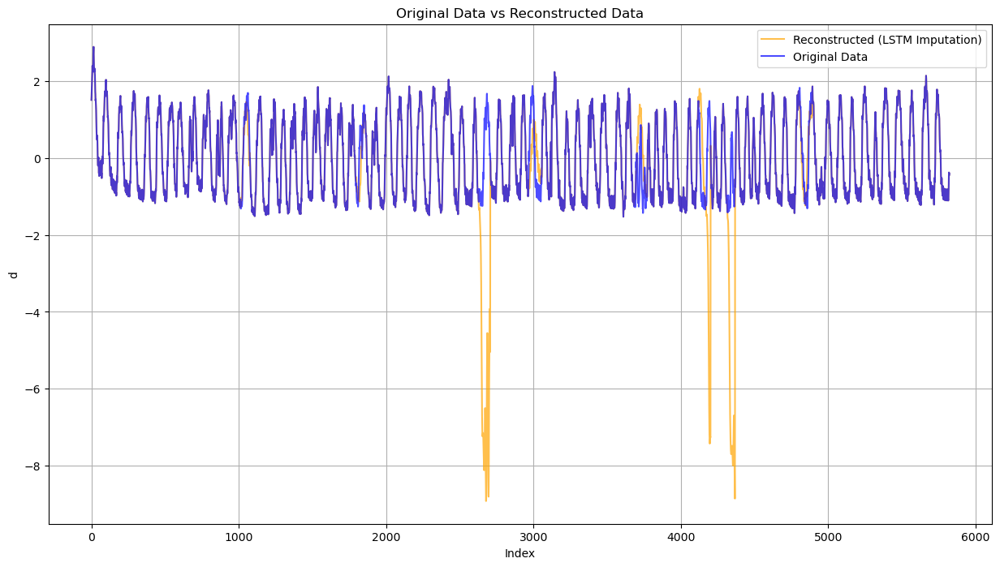

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import os

folder_path = 'Resting_cleaned'  # Folder path

# Load original data
file_original = os.path.join(folder_path, 'ID0001_10hz.csv')
df_original = pd.read_csv(file_original)

# Load missing data with mean imputation
file_missing = os.path.join(folder_path, 'ID0001_10hz_lstm.csv')
df_missing = pd.read_csv(file_missing)

# Plot both
plt.figure(figsize=(15, 8))

# Mean imputed missing data 'mean'
plt.plot(df_missing.index, df_missing['d'], label='Reconstructed (LSTM Imputation)', color='orange', alpha=0.7)

# Original data 'd'
plt.plot(df_original.index, df_original['d'], label='Original Data', color='blue', alpha=0.7)


plt.xlabel('Index')
plt.ylabel('d')
plt.title('Original Data vs Reconstructed Data')
plt.legend()
plt.grid(True)
plt.show()


##### BILSTM MODEL

In [3]:
import os
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense, Bidirectional, Dropout
from tensorflow.keras.callbacks import EarlyStopping

folder_path = "Resting_cleaned"

sequence_length = 50          # total window length
history_length = sequence_length // 2   # past part
future_length = sequence_length - history_length
max_iterations = 5            # iterative imputation passes

def create_gap_sequences(series, seq_len):
    values = series.values
    mask = ~np.isnan(values)

    sequences = []
    targets = []

    start = 0
    n = len(values)

    while start < n:
        # find next contiguous non-missing block
        while start < n and not mask[start]:
            start += 1
        if start >= n:
            break
        end = start
        while end < n and mask[end]:
            end += 1

        block = values[start:end]  # fully observed block
        if len(block) >= seq_len:
            for i in range(len(block) - seq_len):
                window = block[i:i + seq_len]
                target = block[i + seq_len]  # predict next step
                sequences.append(window)
                targets.append(target)

        start = end

    if len(sequences) == 0:
        return None, None

    X = np.array(sequences).reshape(-1, seq_len, 1)
    y = np.array(targets)
    return X, y

for filename in os.listdir(folder_path):
    if not filename.endswith("_10hz_missing.csv"):
        continue

    print(f"Processing {filename}...")
    file_path = os.path.join(folder_path, filename)
    df = pd.read_csv(file_path)

    # Scale only observed values
    scaler = MinMaxScaler(feature_range=(0, 1))
    observed_vals = df["d"].dropna().values.reshape(-1, 1)
    if len(observed_vals) < sequence_length + 1:
        print(f"Not enough observed data in {filename}, skipping.")
        continue
    scaler.fit(observed_vals)
    df["d_scaled"] = scaler.transform(df[["d"]])

    # Build training data from fully observed segments
    X_train, y_train = create_gap_sequences(df["d_scaled"], sequence_length)
    if X_train is None:
        print(f"No suitable training sequences in {filename}, skipping.")
        continue

    # BiGRU model with Dropout
    model = Sequential()
    model.add(Bidirectional(GRU(64, return_sequences=True), input_shape=(sequence_length, 1)))
    model.add(Dropout(0.2))
    model.add(Bidirectional(GRU(32)))
    model.add(Dropout(0.2))
    model.add(Dense(32, activation="relu"))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam")  # MAE as loss

    # Early stopping with validation split
    early_stop = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
    model.fit(
        X_train, y_train,
        epochs=200,
        batch_size=64,
        validation_split=0.2,
        callbacks=[early_stop],
        verbose=1
    )

    # Iterative imputation
    for iteration in range(max_iterations):
        missing_before = df["d"].isna().sum()
        if missing_before == 0:
            break

        print(f"Iteration {iteration + 1}, missing = {missing_before}")

        d_scaled = df["d_scaled"].values.copy()

        for idx in np.where(df["d"].isna())[0]:
            start = idx - history_length
            end = idx + future_length

            start = max(start, 0)
            end = min(end, len(df))

            window = d_scaled[start:end]

            if len(window) < sequence_length:
                if len(window) == 0:
                    continue
                pad_left = max(0, sequence_length - len(window) - (idx - start))
                pad_right = sequence_length - len(window) - pad_left
                left_val = window[0]
                right_val = window[-1]
                window = np.concatenate(
                    [np.full(pad_left, left_val), window, np.full(pad_right, right_val)]
                )

            if np.isnan(window).all():
                continue

            # Forward/backward fill
            for i in range(1, len(window)):
                if np.isnan(window[i]):
                    window[i] = window[i - 1]
            for i in range(len(window) - 2, -1, -1):
                if np.isnan(window[i]):
                    window[i] = window[i + 1]

            input_seq = window.reshape(1, sequence_length, 1)
            pred_scaled = model.predict(input_seq, verbose=0)[0, 0]
            pred_value = scaler.inverse_transform([[pred_scaled]])[0, 0]

            df.at[idx, "d"] = pred_value
            df.at[idx, "d_scaled"] = pred_scaled

        missing_after = df["d"].isna().sum()
        print(f"Missing values remaining = {missing_after}")
        if missing_after == 0 or missing_after == missing_before:
            break

    df.drop(columns=["d_scaled"], inplace=True)
    output_filename = filename.replace("_10hz_missing.csv", "_10hz_bilstm.csv")
    output_path = os.path.join(folder_path, output_filename)
    df.to_csv(output_path, index=False)
    print(f"{output_filename} saved successfully!\n")

Processing ID0009_10hz_missing.csv...
Epoch 1/200


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - loss: 0.1406 - val_loss: 0.1142
Epoch 2/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0840 - val_loss: 0.0641
Epoch 3/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0685 - val_loss: 0.0607
Epoch 4/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0577 - val_loss: 0.0420
Epoch 5/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0472 - val_loss: 0.0322
Epoch 6/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0358 - val_loss: 0.0229
Epoch 7/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0345 - val_loss: 0.0201
Epoch 8/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0322 - val_loss: 0.0214
Epoch 9/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0308 - val_loss: 0.0179
Epoch 10/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0322 - val_loss: 0.0184
Epoch 11/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0315 - val_loss: 0.0339
Epoch 12/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1293 - val_loss: 0.0723
Epoch 2/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0606 - val_loss: 0.0460
Epoch 3/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0481 - val_loss: 0.0263
Epoch 4/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0434 - val_loss: 0.0269
Epoch 5/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0399 - val_loss: 0.0202
Epoch 6/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0355 - val_loss: 0.0257
Epoch 7/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0339 - val_loss: 0.0209
Epoch 8/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0350 - val_loss: 0.0284
Epoch 9/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0309 - val_loss: 0.0199
Epoch 10/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0294 - val_loss: 0.0179
Epoch 11/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0296 - val_loss: 0.0236
Epoch 12/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1014 - val_loss: 0.0609
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0565 - val_loss: 0.0420
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0491 - val_loss: 0.0344
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0447 - val_loss: 0.0368
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0439 - val_loss: 0.0355
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0414 - val_loss: 0.0300
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0404 - val_loss: 0.0299
Epoch 8/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0394 - val_loss: 0.0375
Epoch 9/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0389 - val_loss: 0.0428
Epoch 10/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0398 - val_loss: 0.0375
Epoch 11/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0377 - val_loss: 0.0349
Epoch 12/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - loss: 0.1010 - val_loss: 0.0591
Epoch 2/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0434 - val_loss: 0.0340
Epoch 3/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0352 - val_loss: 0.0243
Epoch 4/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0318 - val_loss: 0.0230
Epoch 5/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0291 - val_loss: 0.0231
Epoch 6/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0278 - val_loss: 0.0232
Epoch 7/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0260 - val_loss: 0.0195
Epoch 8/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0243 - val_loss: 0.0176
Epoch 9/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0231 - val_loss: 0.0267
Epoch 10/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0222 - val_loss: 0.0166
Epoch 11/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0226 - val_loss: 0.0230
Epoch 12/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


67/67 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0936 - val_loss: 0.0379
Epoch 2/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0499 - val_loss: 0.0267
Epoch 3/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0385 - val_loss: 0.0225
Epoch 4/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0348 - val_loss: 0.0208
Epoch 5/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0314 - val_loss: 0.0176
Epoch 6/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0283 - val_loss: 0.0214
Epoch 7/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0264 - val_loss: 0.0165
Epoch 8/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0246 - val_loss: 0.0148
Epoch 9/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0234 - val_loss: 0.0142
Epoch 10/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0228 - val_loss: 0.0141
Epoch 11/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0218 - val_loss: 0.0146
Epoch 12/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - loss: 0.1401 - val_loss: 0.0677
Epoch 2/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0687 - val_loss: 0.0467
Epoch 3/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0571 - val_loss: 0.0362
Epoch 4/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0499 - val_loss: 0.0312
Epoch 5/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0438 - val_loss: 0.0274
Epoch 6/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0447 - val_loss: 0.0264
Epoch 7/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0420 - val_loss: 0.0270
Epoch 8/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0386 - val_loss: 0.0344
Epoch 9/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0392 - val_loss: 0.0347
Epoch 10/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0378 - val_loss: 0.0264
Epoch 11/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0372 - val_loss: 0.0221
Epoch 12/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0678 - val_loss: 0.0272
Epoch 2/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0313 - val_loss: 0.0199
Epoch 3/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0262 - val_loss: 0.0275
Epoch 4/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0239 - val_loss: 0.0169
Epoch 5/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0228 - val_loss: 0.0168
Epoch 6/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0211 - val_loss: 0.0171
Epoch 7/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0217 - val_loss: 0.0193
Epoch 8/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0197 - val_loss: 0.0155
Epoch 9/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0197 - val_loss: 0.0175
Epoch 10/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0185 - val_loss: 0.0179
Epoch 11/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0187 - val_loss: 0.0150
Epoch 12/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


67/67 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0937 - val_loss: 0.0367
Epoch 2/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0411 - val_loss: 0.0271
Epoch 3/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0323 - val_loss: 0.0219
Epoch 4/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0288 - val_loss: 0.0209
Epoch 5/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0260 - val_loss: 0.0186
Epoch 6/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0236 - val_loss: 0.0177
Epoch 7/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0233 - val_loss: 0.0226
Epoch 8/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0226 - val_loss: 0.0207
Epoch 9/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0197 - val_loss: 0.0169
Epoch 10/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0201 - val_loss: 0.0165
Epoch 11/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0189 - val_loss: 0.0185
Epoch 12/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


83/83 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0759 - val_loss: 0.0277
Epoch 2/200
83/83 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0358 - val_loss: 0.0303
Epoch 3/200
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0326 - val_loss: 0.0292
Epoch 4/200
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0299 - val_loss: 0.0363
Epoch 5/200
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0283 - val_loss: 0.0341
Epoch 6/200
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0263 - val_loss: 0.0393
Epoch 7/200
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0251 - val_loss: 0.0297
Epoch 8/200
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0241 - val_loss: 0.0200
Epoch 9/200
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0241 - val_loss: 0.0283
Epoch 10/200
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0228 - val_loss: 0.0263
Epoch 11/200
83/83 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0225 - val_loss: 0.0407
Epoch 12/200
83/83 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1039 - val_loss: 0.0385
Epoch 2/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0478 - val_loss: 0.0417
Epoch 3/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0424 - val_loss: 0.0390
Epoch 4/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0392 - val_loss: 0.0290
Epoch 5/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0385 - val_loss: 0.0349
Epoch 6/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0359 - val_loss: 0.0274
Epoch 7/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0345 - val_loss: 0.0257
Epoch 8/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0330 - val_loss: 0.0323
Epoch 9/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0316 - val_loss: 0.0232
Epoch 10/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0326 - val_loss: 0.0353
Epoch 11/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0305 - val_loss: 0.0243
Epoch 12/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


67/67 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0965 - val_loss: 0.0422
Epoch 2/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0400 - val_loss: 0.0221
Epoch 3/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0340 - val_loss: 0.0238
Epoch 4/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0314 - val_loss: 0.0185
Epoch 5/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0293 - val_loss: 0.0185
Epoch 6/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0282 - val_loss: 0.0177
Epoch 7/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0279 - val_loss: 0.0193
Epoch 8/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0261 - val_loss: 0.0167
Epoch 9/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0254 - val_loss: 0.0168
Epoch 10/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0251 - val_loss: 0.0183
Epoch 11/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0251 - val_loss: 0.0177
Epoch 12/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0888 - val_loss: 0.0366
Epoch 2/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0368 - val_loss: 0.0249
Epoch 3/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0312 - val_loss: 0.0216
Epoch 4/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0309 - val_loss: 0.0230
Epoch 5/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0277 - val_loss: 0.0192
Epoch 6/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0266 - val_loss: 0.0216
Epoch 7/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0248 - val_loss: 0.0210
Epoch 8/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0248 - val_loss: 0.0186
Epoch 9/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0239 - val_loss: 0.0200
Epoch 10/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0242 - val_loss: 0.0184
Epoch 11/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0244 - val_loss: 0.0159
Epoch 12/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


71/71 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.0494 - val_loss: 0.0308
Epoch 2/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0245 - val_loss: 0.0157
Epoch 3/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0219 - val_loss: 0.0137
Epoch 4/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0198 - val_loss: 0.0145
Epoch 5/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0182 - val_loss: 0.0160
Epoch 6/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0181 - val_loss: 0.0125
Epoch 7/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0180 - val_loss: 0.0131
Epoch 8/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0179 - val_loss: 0.0139
Epoch 9/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0168 - val_loss: 0.0117
Epoch 10/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0169 - val_loss: 0.0150
Epoch 11/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0167 - val_loss: 0.0118
Epoch 12/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


55/55 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0997 - val_loss: 0.0518
Epoch 2/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0461 - val_loss: 0.0320
Epoch 3/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0391 - val_loss: 0.0267
Epoch 4/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0347 - val_loss: 0.0335
Epoch 5/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0337 - val_loss: 0.0271
Epoch 6/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0307 - val_loss: 0.0201
Epoch 7/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0291 - val_loss: 0.0197
Epoch 8/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0288 - val_loss: 0.0260
Epoch 9/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0283 - val_loss: 0.0238
Epoch 10/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0268 - val_loss: 0.0210
Epoch 11/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0273 - val_loss: 0.0194
Epoch 12/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


41/41 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - loss: 0.0518 - val_loss: 0.0294
Epoch 2/200
41/41 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0247 - val_loss: 0.0192
Epoch 3/200
41/41 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0192 - val_loss: 0.0163
Epoch 4/200
41/41 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0159 - val_loss: 0.0122
Epoch 5/200
41/41 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0156 - val_loss: 0.0158
Epoch 6/200
41/41 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0151 - val_loss: 0.0099
Epoch 7/200
41/41 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0134 - val_loss: 0.0127
Epoch 8/200
41/41 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0119 - val_loss: 0.0070
Epoch 9/200
41/41 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0118 - val_loss: 0.0083
Epoch 10/200
41/41 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0111 - val_loss: 0.0086
Epoch 11/200
41/41 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0105 - val_loss: 0.0057
Epoch 12/200
41/41 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


70/70 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0983 - val_loss: 0.0280
Epoch 2/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0452 - val_loss: 0.0267
Epoch 3/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0378 - val_loss: 0.0312
Epoch 4/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0349 - val_loss: 0.0181
Epoch 5/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0330 - val_loss: 0.0173
Epoch 6/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0315 - val_loss: 0.0175
Epoch 7/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0299 - val_loss: 0.0243
Epoch 8/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0278 - val_loss: 0.0200
Epoch 9/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0263 - val_loss: 0.0256
Epoch 10/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0254 - val_loss: 0.0162
Epoch 11/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0249 - val_loss: 0.0164
Epoch 12/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0885 - val_loss: 0.0408
Epoch 2/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0411 - val_loss: 0.0263
Epoch 3/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0362 - val_loss: 0.0214
Epoch 4/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0356 - val_loss: 0.0201
Epoch 5/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0318 - val_loss: 0.0206
Epoch 6/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0306 - val_loss: 0.0207
Epoch 7/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0288 - val_loss: 0.0202
Epoch 8/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0283 - val_loss: 0.0185
Epoch 9/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0277 - val_loss: 0.0203
Epoch 10/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0272 - val_loss: 0.0296
Epoch 11/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0271 - val_loss: 0.0178
Epoch 12/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0796 - val_loss: 0.0140
Epoch 2/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0297 - val_loss: 0.0146
Epoch 3/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0250 - val_loss: 0.0192
Epoch 4/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0238 - val_loss: 0.0110
Epoch 5/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0209 - val_loss: 0.0206
Epoch 6/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0185 - val_loss: 0.0227
Epoch 7/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0173 - val_loss: 0.0205
Epoch 8/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0166 - val_loss: 0.0311
Epoch 9/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0166 - val_loss: 0.0323
Epoch 10/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0155 - val_loss: 0.0182
Epoch 11/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0146 - val_loss: 0.0163
Epoch 12/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


52/52 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step - loss: 0.0856 - val_loss: 0.0564
Epoch 2/200
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0530 - val_loss: 0.0442
Epoch 3/200
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0458 - val_loss: 0.0388
Epoch 4/200
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0431 - val_loss: 0.0344
Epoch 5/200
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0416 - val_loss: 0.0370
Epoch 6/200
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0395 - val_loss: 0.0396
Epoch 7/200
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0397 - val_loss: 0.0307
Epoch 8/200
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0359 - val_loss: 0.0294
Epoch 9/200
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0354 - val_loss: 0.0378
Epoch 10/200
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0336 - val_loss: 0.0292
Epoch 11/200
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0332 - val_loss: 0.0277
Epoch 12/200
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.0721 - val_loss: 0.0328
Epoch 2/200
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0337 - val_loss: 0.0194
Epoch 3/200
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0275 - val_loss: 0.0211
Epoch 4/200
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0262 - val_loss: 0.0174
Epoch 5/200
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0243 - val_loss: 0.0184
Epoch 6/200
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0232 - val_loss: 0.0152
Epoch 7/200
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0223 - val_loss: 0.0154
Epoch 8/200
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0207 - val_loss: 0.0189
Epoch 9/200
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0205 - val_loss: 0.0160
Epoch 10/200
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0213 - val_loss: 0.0151
Epoch 11/200
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0195 - val_loss: 0.0131
Epoch 12/200
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1015 - val_loss: 0.0464
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0479 - val_loss: 0.0396
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0398 - val_loss: 0.0279
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0369 - val_loss: 0.0240
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0339 - val_loss: 0.0234
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0309 - val_loss: 0.0239
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0301 - val_loss: 0.0203
Epoch 8/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0279 - val_loss: 0.0208
Epoch 9/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0259 - val_loss: 0.0265
Epoch 10/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0247 - val_loss: 0.0181
Epoch 11/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0248 - val_loss: 0.0217
Epoch 12/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


46/46 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1219 - val_loss: 0.0488
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0606 - val_loss: 0.0322
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0483 - val_loss: 0.0338
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0424 - val_loss: 0.0249
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0430 - val_loss: 0.0364
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0386 - val_loss: 0.0262
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0357 - val_loss: 0.0274
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0348 - val_loss: 0.0330
Epoch 9/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0324 - val_loss: 0.0316
Epoch 10/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0306 - val_loss: 0.0283
Epoch 11/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0301 - val_loss: 0.0414
Epoch 12/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0684 - val_loss: 0.0209
Epoch 2/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0277 - val_loss: 0.0137
Epoch 3/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0224 - val_loss: 0.0086
Epoch 4/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0187 - val_loss: 0.0095
Epoch 5/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0176 - val_loss: 0.0122
Epoch 6/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0173 - val_loss: 0.0149
Epoch 7/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0162 - val_loss: 0.0139
Epoch 8/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0162 - val_loss: 0.0098
Epoch 9/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0156 - val_loss: 0.0112
Epoch 10/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0155 - val_loss: 0.0102
Epoch 11/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0147 - val_loss: 0.0129
Epoch 12/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0870 - val_loss: 0.0299
Epoch 2/200
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0407 - val_loss: 0.0274
Epoch 3/200
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0344 - val_loss: 0.0222
Epoch 4/200
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0319 - val_loss: 0.0191
Epoch 5/200
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0287 - val_loss: 0.0194
Epoch 6/200
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0286 - val_loss: 0.0180
Epoch 7/200
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0268 - val_loss: 0.0180
Epoch 8/200
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0255 - val_loss: 0.0180
Epoch 9/200
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0243 - val_loss: 0.0208
Epoch 10/200
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0236 - val_loss: 0.0186
Epoch 11/200
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0223 - val_loss: 0.0157
Epoch 12/200
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


52/52 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0831 - val_loss: 0.0313
Epoch 2/200
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0383 - val_loss: 0.0189
Epoch 3/200
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0283 - val_loss: 0.0196
Epoch 4/200
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0250 - val_loss: 0.0162
Epoch 5/200
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0236 - val_loss: 0.0161
Epoch 6/200
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0234 - val_loss: 0.0180
Epoch 7/200
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0213 - val_loss: 0.0161
Epoch 8/200
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0212 - val_loss: 0.0166
Epoch 9/200
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0197 - val_loss: 0.0150
Epoch 10/200
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0203 - val_loss: 0.0145
Epoch 11/200
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0189 - val_loss: 0.0141
Epoch 12/200
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step - loss: 0.0926 - val_loss: 0.0512
Epoch 2/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0503 - val_loss: 0.0279
Epoch 3/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0324 - val_loss: 0.0304
Epoch 4/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0335 - val_loss: 0.0237
Epoch 5/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0266 - val_loss: 0.0232
Epoch 6/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0244 - val_loss: 0.0186
Epoch 7/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0225 - val_loss: 0.0183
Epoch 8/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0221 - val_loss: 0.0177
Epoch 9/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0220 - val_loss: 0.0181
Epoch 10/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0219 - val_loss: 0.0174
Epoch 11/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0220 - val_loss: 0.0177
Epoch 12/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0589 - val_loss: 0.0335
Epoch 2/200
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0309 - val_loss: 0.0233
Epoch 3/200
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0255 - val_loss: 0.0238
Epoch 4/200
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0224 - val_loss: 0.0195
Epoch 5/200
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0200 - val_loss: 0.0210
Epoch 6/200
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0193 - val_loss: 0.0171
Epoch 7/200
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0183 - val_loss: 0.0223
Epoch 8/200
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0178 - val_loss: 0.0191
Epoch 9/200
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0166 - val_loss: 0.0187
Epoch 10/200
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0169 - val_loss: 0.0200
Epoch 11/200
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0169 - val_loss: 0.0213
Epoch 12/200
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


62/62 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step - loss: 0.1207 - val_loss: 0.0489
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0542 - val_loss: 0.0366
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0407 - val_loss: 0.0311
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0355 - val_loss: 0.0230
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0361 - val_loss: 0.0221
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0315 - val_loss: 0.0211
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0293 - val_loss: 0.0196
Epoch 8/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0278 - val_loss: 0.0196
Epoch 9/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0261 - val_loss: 0.0205
Epoch 10/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0253 - val_loss: 0.0204
Epoch 11/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0235 - val_loss: 0.0173
Epoch 12/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


61/61 ━━━━━━━━━━━━━━━━━━━━ 26s 344ms/step - loss: 0.0569 - val_loss: 0.0425
Epoch 2/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0373 - val_loss: 0.0331
Epoch 3/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0350 - val_loss: 0.0316
Epoch 4/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0315 - val_loss: 0.0299
Epoch 5/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0306 - val_loss: 0.0331
Epoch 6/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0308 - val_loss: 0.0294
Epoch 7/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0312 - val_loss: 0.0289
Epoch 8/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0297 - val_loss: 0.0285
Epoch 9/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0293 - val_loss: 0.0299
Epoch 10/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0298 - val_loss: 0.0293
Epoch 11/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0300 - val_loss: 0.0296
Epoch 12/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


63/63 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step - loss: 0.1135 - val_loss: 0.0599
Epoch 2/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0485 - val_loss: 0.0460
Epoch 3/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0425 - val_loss: 0.0411
Epoch 4/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0402 - val_loss: 0.0256
Epoch 5/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0370 - val_loss: 0.0259
Epoch 6/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0343 - val_loss: 0.0401
Epoch 7/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0341 - val_loss: 0.0280
Epoch 8/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0323 - val_loss: 0.0384
Epoch 9/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0309 - val_loss: 0.0248
Epoch 10/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0298 - val_loss: 0.0267
Epoch 11/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0292 - val_loss: 0.0362
Epoch 12/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0

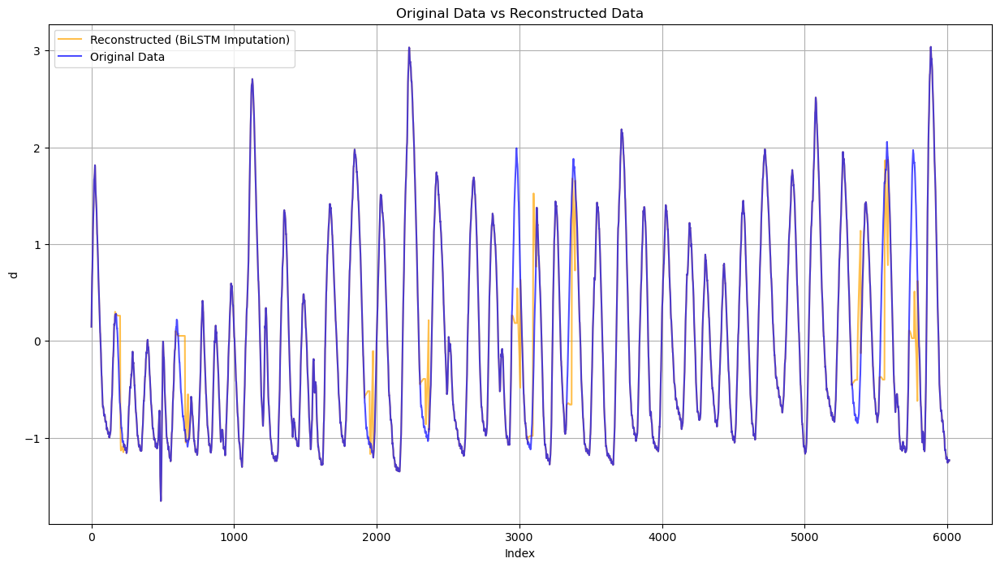

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import os

folder_path = 'Resting_cleaned'  # Folder path

# Load original data
file_original = os.path.join(folder_path, 'ID0003_10hz.csv')
df_original = pd.read_csv(file_original)

# Load missing data with mean imputation
file_missing = os.path.join(folder_path, 'ID0003_10hz_bilstm.csv')
df_missing = pd.read_csv(file_missing)

# Plot both
plt.figure(figsize=(15, 8))

# Mean imputed missing data 'mean'
plt.plot(df_missing.index, df_missing['d'], label='Reconstructed (BiLSTM Imputation)', color='orange', alpha=0.7)

# Original data 'd'
plt.plot(df_original.index, df_original['d'], label='Original Data', color='blue', alpha=0.7)


plt.xlabel('Index')
plt.ylabel('d')
plt.title('Original Data vs Reconstructed Data')
plt.legend()
plt.grid(True)
plt.show()


##### Improved BiLSTM

In [4]:
import os
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense, Bidirectional, Dropout, LayerNormalization
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

folder_path = "Resting_cleaned"

# Model and window config tailored for 60–90 step gaps
sequence_length = 120       # context window (past+future)
history_ratio = 0.6         # more past than future for causal structure
history_length = int(sequence_length * history_ratio)
future_length = sequence_length - history_length
future_steps = 30           # predict 30 steps ahead per window

max_iterations = 5          # iterative imputation passes


def create_gap_sequences(series, seq_len, future_steps):
    """
    Build (X, y) from fully observed segments:
    X: windows of length seq_len
    y: next `future_steps` values after each window
    """
    values = series.values
    mask = ~np.isnan(values)

    sequences = []
    targets = []

    start = 0
    n = len(values)

    while start < n:
        # find next contiguous non-missing block
        while start < n and not mask[start]:
            start += 1
        if start >= n:
            break
        end = start
        while end < n and mask[end]:
            end += 1

        block = values[start:end]  # fully observed block
        # need room for window + future_steps
        if len(block) >= seq_len + future_steps:
            for i in range(len(block) - seq_len - future_steps + 1):
                window = block[i:i + seq_len]
                target = block[i + seq_len:i + seq_len + future_steps]
                sequences.append(window)
                targets.append(target)

        start = end

    if len(sequences) == 0:
        return None, None

    X = np.array(sequences).reshape(-1, seq_len, 1)
    y = np.array(targets)  # shape: (N, future_steps)
    return X, y


# 1) Build a global training set from all files
all_X = []
all_y = []
all_scalers = {}
file_dfs = {}

for filename in os.listdir(folder_path):
    if not filename.endswith("_10hz_missing.csv"):
        continue

    file_path = os.path.join(folder_path, filename)
    df = pd.read_csv(file_path)

    # Scale only observed values
    scaler = MinMaxScaler(feature_range=(0, 1))
    observed_vals = df["d"].dropna().values.reshape(-1, 1)
    if len(observed_vals) < sequence_length + future_steps:
        print(f"Not enough observed data in {filename}, skipping from training.")
        continue

    scaler.fit(observed_vals)
    df["d_scaled"] = scaler.transform(df[["d"]])

    # Store scaler and df for later imputation
    all_scalers[filename] = scaler
    file_dfs[filename] = df

    # Build training sequences
    X_train, y_train = create_gap_sequences(df["d_scaled"], sequence_length, future_steps)
    if X_train is None:
        print(f"No suitable training sequences in {filename}, skipping from training.")
        continue

    all_X.append(X_train)
    all_y.append(y_train)

if len(all_X) == 0:
    raise ValueError("No training data found across files.")

X_train_global = np.concatenate(all_X, axis=0)
y_train_global = np.concatenate(all_y, axis=0)
print("Global training data shape:", X_train_global.shape, y_train_global.shape)

# 2) Build and train a single global model
model = Sequential()
model.add(Bidirectional(GRU(32, return_sequences=True), input_shape=(sequence_length, 1)))
model.add(LayerNormalization())
model.add(Dropout(0.2))
model.add(Bidirectional(GRU(32)))
model.add(LayerNormalization())
model.add(Dropout(0.2))
model.add(Dense(32, activation="relu"))
model.add(Dense(future_steps))  # predict multiple future steps
model.compile(loss="mae", optimizer="adam")

early_stop = EarlyStopping(monitor="val_loss", patience=15, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5, verbose=1, min_lr=1e-5)

model.fit(
    X_train_global, y_train_global,
    epochs=200,
    batch_size=64,
    validation_split=0.2,
    callbacks=[early_stop, reduce_lr],
    verbose=1
)

# 3) Impute each file using the global model
for filename, df in file_dfs.items():
    print(f"Imputing {filename}...")
    scaler = all_scalers[filename]

    # Ensure scaled column exists and is up to date
    df["d_scaled"] = scaler.transform(df[["d"]])

    for iteration in range(max_iterations):
        missing_before = df["d"].isna().sum()
        if missing_before == 0:
            break

        print(f"Iteration {iteration + 1}, missing = {missing_before} for {filename}")
        d_scaled = df["d_scaled"].values.copy()
        missing_idxs = np.where(df["d"].isna())[0]

        for idx in missing_idxs:
            # Center window roughly around idx with more history
            start = idx - history_length
            end = idx + future_length

            start = max(start, 0)
            end = min(end, len(df))

            window = d_scaled[start:end]

            if len(window) == 0:
                continue

            # Pad to full sequence_length with edge values
            if len(window) < sequence_length:
                pad_left = max(0, sequence_length - len(window) - (idx - start))
                pad_right = sequence_length - len(window) - pad_left
                left_val = window[0]
                right_val = window[-1]
                window = np.concatenate(
                    [np.full(pad_left, left_val), window, np.full(pad_right, right_val)]
                )

            # If still shorter for some reason, skip
            if len(window) < sequence_length:
                continue

            # Forward/backward fill NaNs inside the window (rare because training is on observed blocks)
            for i in range(1, len(window)):
                if np.isnan(window[i]):
                    window[i] = window[i - 1]
            for i in range(len(window) - 2, -1, -1):
                if np.isnan(window[i]):
                    window[i] = window[i + 1]

            input_seq = window[:sequence_length].reshape(1, sequence_length, 1)
            preds_scaled = model.predict(input_seq, verbose=0)[0]  # shape: (future_steps,)

            # Choose horizon based on relative position of idx in window:
            # how far ahead from the end of the window
            offset_from_end = (idx - start + 1) - sequence_length
            # map to [0, future_steps-1]
            # but simpler: use middle horizon for stability
            horizon_idx = future_steps // 2
            pred_scaled = preds_scaled[horizon_idx]

            pred_value = scaler.inverse_transform([[pred_scaled]])[0, 0]

            df.at[idx, "d"] = pred_value
            df.at[idx, "d_scaled"] = pred_scaled

        missing_after = df["d"].isna().sum()
        print(f"Missing values remaining = {missing_after} for {filename}")
        if missing_after == 0 or missing_after == missing_before:
            break

    df.drop(columns=["d_scaled"], inplace=True)
    output_filename = filename.replace("_10hz_missing.csv", "_10hz_bilstm_gaps60_90.csv")
    output_path = os.path.join(folder_path, output_filename)
    df.to_csv(output_path, index=False)
    print(f"{output_filename} saved successfully!\n")


2025-12-02 16:23:14.218228: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2025-12-02 16:23:14.229411: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-12-02 16:23:14.690187: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 AVX512_FP16 AVX_VNNI AMX_TILE AMX_INT8 AMX_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-12-02 16:23:15.937108: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-poin

Global training data shape: (112948, 120, 1) (112948, 30)


E0000 00:00:1764692596.408348 1818160 cuda_executor.cc:1309] INTERNAL: CUDA Runtime error: Failed call to cudaGetRuntimeVersion: Error loading CUDA libraries. GPU will not be used.: Error loading CUDA libraries. GPU will not be used.
W0000 00:00:1764692596.435476 1818160 gpu_device.cc:2342] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/200
1412/1412 ━━━━━━━━━━━━━━━━━━━━ 82s 56ms/step - loss: 0.1488 - val_loss: 0.1103 - learning_rate: 0.0010
Epoch 2/200
1412/1412 ━━━━━━━━━━━━━━━━━━━━ 82s 58ms/step - loss: 0.1090 - val_loss: 0.0962 - learning_rate: 0.0010
Epoch 3/200
1412/1412 ━━━━━━━━━━━━━━━━━━━━ 80s 57ms/step - loss: 0.0993 - val_loss: 0.0947 - learning_rate: 0.0010
Epoch 4/200
1412/1412 ━━━━━━━━━━━━━━━━━━━━ 82s 58ms/step - loss: 0.0949 - val_loss: 0.0933 - learning_rate: 0.0010
Epoch 5/200
1412/1412 ━━━━━━━━━━━━━━━━━━━━ 79s 56ms/step - loss: 0.0925 - val_loss: 0.0938 - learning_rate: 0.0010
Epoch 6/200
1412/1412 ━━━━━━━━━━━━━━━━━━━━ 78s 56ms/step - loss: 0.0903 - val_loss: 0.0941 - learning_rate: 0.0010
Epoch 7/200
1412/1412 ━━━━━━━━━━━━━━━━━━━━ 81s 57ms/step - loss: 0.0884 - val_loss: 0.0924 - learning_rate: 0.0010
Epoch 8/200
1412/1412 ━━━━━━━━━━━━━━━━━━━━ 82s 58ms/step - loss: 0.0872 - val_loss: 0.0929 - learning_rate: 0.0010
Epoch 9/200
1412/1412 ━━━━━━━━━━━━━━━━━━━━ 82s 58ms/step - loss: 0.0855 - val_lo

/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0009_10hz_missing.csv
ID0009_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0014_10hz_missing.csv...
Iteration 1, missing = 600 for ID0014_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0014_10hz_missing.csv
ID0014_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0011_10hz_missing.csv...
Iteration 1, missing = 660 for ID0011_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0011_10hz_missing.csv
ID0011_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0008_10hz_missing.csv...
Iteration 1, missing = 630 for ID0008_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0008_10hz_missing.csv
ID0008_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0022_10hz_missing.csv...
Iteration 1, missing = 690 for ID0022_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0022_10hz_missing.csv
ID0022_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0017_10hz_missing.csv...
Iteration 1, missing = 390 for ID0017_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0017_10hz_missing.csv
ID0017_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0019_10hz_missing.csv...
Iteration 1, missing = 630 for ID0019_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0019_10hz_missing.csv
ID0019_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0015_10hz_missing.csv...
Iteration 1, missing = 660 for ID0015_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0015_10hz_missing.csv
ID0015_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0026_10hz_missing.csv...
Iteration 1, missing = 870 for ID0026_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0026_10hz_missing.csv
ID0026_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0001_10hz_missing.csv...
Iteration 1, missing = 630 for ID0001_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0001_10hz_missing.csv
ID0001_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0020_10hz_missing.csv...
Iteration 1, missing = 660 for ID0020_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0020_10hz_missing.csv
ID0020_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0005_10hz_missing.csv...
Iteration 1, missing = 630 for ID0005_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0005_10hz_missing.csv
ID0005_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0013_10hz_missing.csv...
Iteration 1, missing = 720 for ID0013_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0013_10hz_missing.csv
ID0013_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0016_10hz_missing.csv...
Iteration 1, missing = 630 for ID0016_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0016_10hz_missing.csv
ID0016_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0030_10hz_missing.csv...
Iteration 1, missing = 480 for ID0030_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0030_10hz_missing.csv
ID0030_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0023_10hz_missing.csv...
Iteration 1, missing = 750 for ID0023_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0023_10hz_missing.csv
ID0023_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0024_10hz_missing.csv...
Iteration 1, missing = 690 for ID0024_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0024_10hz_missing.csv
ID0024_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0003_10hz_missing.csv...
Iteration 1, missing = 630 for ID0003_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0003_10hz_missing.csv
ID0003_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0025_10hz_missing.csv...
Iteration 1, missing = 600 for ID0025_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0025_10hz_missing.csv
ID0025_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0012_10hz_missing.csv...
Iteration 1, missing = 600 for ID0012_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0012_10hz_missing.csv
ID0012_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0029_10hz_missing.csv...
Iteration 1, missing = 660 for ID0029_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0029_10hz_missing.csv
ID0029_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0004_10hz_missing.csv...
Iteration 1, missing = 510 for ID0004_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0004_10hz_missing.csv
ID0004_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0028_10hz_missing.csv...
Iteration 1, missing = 630 for ID0028_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0028_10hz_missing.csv
ID0028_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0027_10hz_missing.csv...
Iteration 1, missing = 660 for ID0027_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0027_10hz_missing.csv
ID0027_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0018_10hz_missing.csv...
Iteration 1, missing = 540 for ID0018_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0018_10hz_missing.csv
ID0018_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0002_10hz_missing.csv...
Iteration 1, missing = 270 for ID0002_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0002_10hz_missing.csv
ID0002_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0007_10hz_missing.csv...
Iteration 1, missing = 660 for ID0007_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0007_10hz_missing.csv
ID0007_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0021_10hz_missing.csv...
Iteration 1, missing = 630 for ID0021_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0021_10hz_missing.csv
ID0021_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0006_10hz_missing.csv...
Iteration 1, missing = 600 for ID0006_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0006_10hz_missing.csv
ID0006_10hz_bilstm_gaps60_90.csv saved successfully!

Imputing ID0010_10hz_missing.csv...
Iteration 1, missing = 690 for ID0010_10hz_missing.csv


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


Missing values remaining = 0 for ID0010_10hz_missing.csv
ID0010_10hz_bilstm_gaps60_90.csv saved successfully!



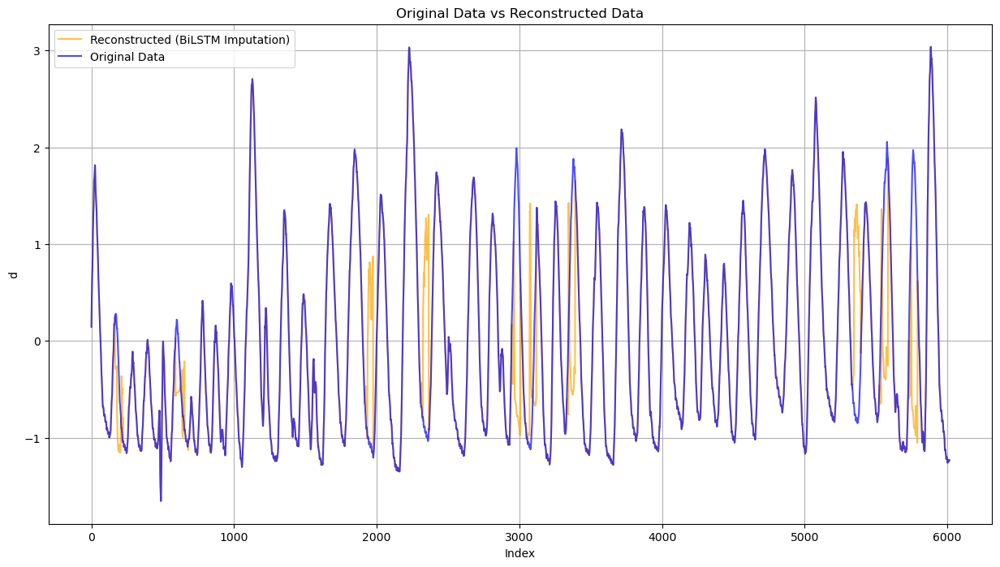

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import os

folder_path = 'Resting_cleaned'  # Folder path

# Load original data
file_original = os.path.join(folder_path, 'ID0003_10hz.csv')
df_original = pd.read_csv(file_original)

# Load missing data with mean imputation
file_missing = os.path.join(folder_path, 'ID0003_10hz_bilstm_gaps60_90.csv')
df_missing = pd.read_csv(file_missing)

# Plot both
plt.figure(figsize=(15, 8))

# Mean imputed missing data 'mean'
plt.plot(df_missing.index, df_missing['d'], label='Reconstructed (BiLSTM Imputation)', color='orange', alpha=0.7)

# Original data 'd'
plt.plot(df_original.index, df_original['d'], label='Original Data', color='blue', alpha=0.7)


plt.xlabel('Index')
plt.ylabel('d')
plt.title('Original Data vs Reconstructed Data')
plt.legend()
plt.grid(True)
plt.show()


#### New1 BILSTM (seq2seq)

In [1]:
import os
import numpy as np
import pandas as pd
from sklearn.preprocessing import RobustScaler
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
    Input, GRU, Dense, Masking, RepeatVector,
    TimeDistributed, LayerNormalization, Dropout
)
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau


folder_path = "Resting_cleaned"

# --- CONFIG ---
sequence_length = 120
future_steps = 30
max_iterations = 5

# -------------------------------------------------------
# 1) ROLLING WINDOW GENERATOR (WORKS EVEN WITH SOME NaNs)
# -------------------------------------------------------

def rolling_windows(series, seq_len, future_steps, max_nan_ratio=0.2):
    """
    Create sliding windows even if data contains NaNs.
    Ignore windows with more than max_nan_ratio missing.
    """
    values = series.values
    n = len(values)
    X, Y = [], []

    for i in range(n - seq_len - future_steps + 1):
        window = values[i:i + seq_len]
        target = values[i + seq_len: i + seq_len + future_steps]

        # skip if too many NaNs
        if np.isnan(window).mean() > max_nan_ratio:
            continue
        if np.isnan(target).mean() > 0:
            continue

        # temporary internal fill (model has Masking)
        w = window.copy()
        mask = np.isnan(w)
        if np.any(mask):
            # simple fill inside window
            w[mask] = np.nanmean(w)

        X.append(w)
        Y.append(target)

    if len(X) == 0:
        return None, None

    return (
        np.array(X).reshape(-1, seq_len, 1),
        np.array(Y)
    )

# -------------------------------------------------------
# 2) BUILD GLOBAL TRAINING SET
# -------------------------------------------------------

all_X, all_y = [], []
file_dfs, all_scalers = {}, {}

for filename in os.listdir(folder_path):
    if not filename.endswith("_10hz_missing.csv"):
        continue

    df = pd.read_csv(os.path.join(folder_path, filename))

    scaler = RobustScaler()
    observed = df["d"].dropna().values.reshape(-1, 1)

    if len(observed) < sequence_length + future_steps:
        print(f"Not enough observed data in {filename}, skipping.")
        continue

    scaler.fit(observed)
    df["d_scaled"] = scaler.transform(df[["d"]])

    file_dfs[filename] = df
    all_scalers[filename] = scaler

    X, Y = rolling_windows(df["d_scaled"], sequence_length, future_steps)

    if X is None:
        print(f"No usable windows in {filename}, skipping.")
        continue

    all_X.append(X)
    all_y.append(Y)

X_train = np.concatenate(all_X, axis=0)
y_train = np.concatenate(all_y, axis=0)

print("Training set:", X_train.shape, y_train.shape)

# -------------------------------------------------------
# 3) ENCODER–DECODER (SEQ2SEQ) MODEL
# -------------------------------------------------------

encoder_input = Input(shape=(sequence_length, 1))

x = Masking(mask_value=0.0)(encoder_input)
x = GRU(64, return_sequences=False)(x)
x = LayerNormalization()(x)
x = Dropout(0.2)(x)

# Context vector repeated for decoder
x = RepeatVector(future_steps)(x)

decoder_output = GRU(64, return_sequences=True)(x)
decoder_output = LayerNormalization()(decoder_output)
decoder_output = Dropout(0.2)(decoder_output)

# final prediction for each future step
decoder_output = TimeDistributed(Dense(1))(decoder_output)

model = Model(encoder_input, decoder_output)
model.compile(optimizer="adam", loss="mae")

model.summary()

early = EarlyStopping(monitor="val_loss", patience=15, restore_best_weights=True)
reduce = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5, min_lr=1e-5)

model.fit(
    X_train, y_train.reshape(-1, future_steps, 1),
    epochs=200,
    batch_size=64,
    validation_split=0.2,
    callbacks=[early, reduce],
    verbose=1
)

# -------------------------------------------------------
# 4) HORIZON-AWARE IMPUTATION
# -------------------------------------------------------

def pick_horizon(idx, start_idx, seq_len, future_steps):
    # position relative to end of window
    offset = idx - (start_idx + seq_len - 1)
    return np.clip(offset, 0, future_steps - 1)


for filename, df in file_dfs.items():
    print(f"Imputing {filename} ...")

    scaler = all_scalers[filename]

    for iteration in range(max_iterations):
        missing_before = df["d"].isna().sum()
        if missing_before == 0:
            break

        print(f" Iter {iteration+1}, missing={missing_before}")

        values = df["d_scaled"].values.copy()
        missing_idx = np.where(np.isnan(df["d"]))[0]

        for idx in missing_idx:
            start = max(0, idx - sequence_length + 1)
            end = start + sequence_length

            window = values[start:end]

            if len(window) < sequence_length:
                pad_needed = sequence_length - len(window)
                window = np.concatenate(
                    [np.full(pad_needed, window[0]), window]
                )

            # Fill NaNs inside window—Masking handles padded zeros
            w = window.copy()
            if np.isnan(w).any():
                w[np.isnan(w)] = np.nanmean(w)

            w = w.reshape(1, sequence_length, 1)
            preds = model.predict(w, verbose=0)[0].flatten()

            # correct horizon
            h = pick_horizon(idx, start, sequence_length, future_steps)
            pred_scaled = preds[h]

            value = scaler.inverse_transform([[pred_scaled]])[0, 0]

            df.at[idx, "d"] = value
            df.at[idx, "d_scaled"] = pred_scaled

        if df["d"].isna().sum() == missing_before:
            break

    df.drop(columns=["d_scaled"], inplace=True)
    out_file = filename.replace("_10hz_missing.csv", "_10hz_seq2seq_imputed.csv")
    df.to_csv(os.path.join(folder_path, out_file), index=False)
    print(f" Saved {out_file}\n")


2025-12-03 11:47:39.274355: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2025-12-03 11:47:39.274797: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-12-03 11:47:39.331120: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 AVX512_FP16 AVX_VNNI AMX_TILE AMX_INT8 AMX_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-12-03 11:47:41.124491: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-poin

Training set: (117719, 120, 1) (117719, 30)


W0000 00:00:1764762463.619711 3680164 gpu_device.cc:2342] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 120, 1)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ not_equal           │ (None, 120, 1)    │          0 │ input_layer[0][0] │
│ (NotEqual)          │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ masking (Masking)   │ (None, 120, 1)    │          0 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ any (Any)           │ (None, 120)       │          0 │ not_equal[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru (GRU)           │ (None, 64)        │     12,864 │ masking[0][0],    │
│                     │                   │            │ any[0][0]         │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalization │ (None, 64)        │        128 │ gru[0][0]         │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 64)        │          0 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector       │ (None, 30, 64)    │          0 │ dropout[0][0]     │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_1 (GRU)         │ (None, 30, 64)    │     24,960 │ repeat_vector[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 30, 64)    │        128 │ gru_1[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 30, 64)    │          0 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed    │ (None, 30, 1)     │         65 │ dropout_1[0][0]   │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 38,145 (149.00 KB)

 Trainable params: 38,145 (149.00 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
   1/1472 ━━━━━━━━━━━━━━━━━━━━ 1:11:04 3s/step - loss: 0.8924

2025-12-03 11:47:46.809696: E tensorflow/core/util/util.cc:131] oneDNN supports DT_BOOL only on platforms with AVX-512. Falling back to the default Eigen-based implementation if present.


1472/1472 ━━━━━━━━━━━━━━━━━━━━ 68s 44ms/step - loss: 0.4444 - val_loss: 0.4553 - learning_rate: 0.0010
Epoch 2/200
1472/1472 ━━━━━━━━━━━━━━━━━━━━ 65s 44ms/step - loss: 0.3566 - val_loss: 0.4135 - learning_rate: 0.0010
Epoch 3/200
1472/1472 ━━━━━━━━━━━━━━━━━━━━ 66s 45ms/step - loss: 0.3136 - val_loss: 0.3963 - learning_rate: 0.0010
Epoch 4/200
1472/1472 ━━━━━━━━━━━━━━━━━━━━ 77s 52ms/step - loss: 0.2955 - val_loss: 0.3808 - learning_rate: 0.0010
Epoch 5/200
1472/1472 ━━━━━━━━━━━━━━━━━━━━ 89s 61ms/step - loss: 0.2860 - val_loss: 0.3876 - learning_rate: 0.0010
Epoch 6/200
1472/1472 ━━━━━━━━━━━━━━━━━━━━ 99s 67ms/step - loss: 0.2795 - val_loss: 0.3954 - learning_rate: 0.0010
Epoch 7/200
1472/1472 ━━━━━━━━━━━━━━━━━━━━ 80s 54ms/step - loss: 0.2741 - val_loss: 0.3868 - learning_rate: 0.0010
Epoch 8/200
1472/1472 ━━━━━━━━━━━━━━━━━━━━ 71s 48ms/step - loss: 0.2701 - val_loss: 0.3946 - learning_rate: 0.0010
Epoch 9/200
1472/1472 ━━━━━━━━━━━━━━━━━━━━ 68s 46ms/step - loss: 0.2665 - val_loss: 0.4015 -

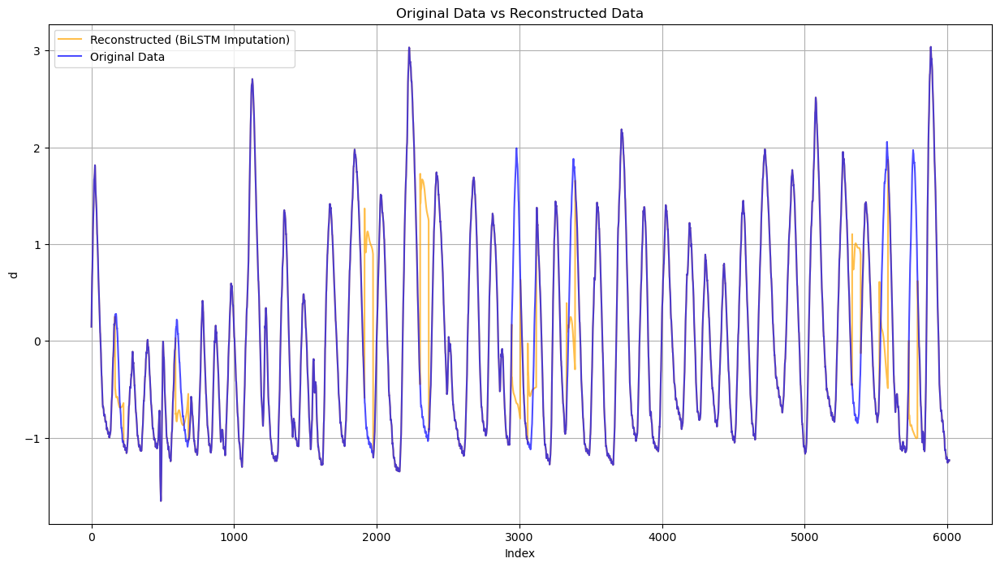

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import os

folder_path = 'Resting_cleaned'  # Folder path

# Load original data
file_original = os.path.join(folder_path, 'ID0003_10hz.csv')
df_original = pd.read_csv(file_original)

# Load missing data with mean imputation
file_missing = os.path.join(folder_path, 'ID0003_10hz_seq2seq_imputed.csv')
df_missing = pd.read_csv(file_missing)

# Plot both
plt.figure(figsize=(15, 8))

# Mean imputed missing data 'mean'
plt.plot(df_missing.index, df_missing['d'], label='Reconstructed (BiLSTM Imputation)', color='orange', alpha=0.7)

# Original data 'd'
plt.plot(df_original.index, df_original['d'], label='Original Data', color='blue', alpha=0.7)


plt.xlabel('Index')
plt.ylabel('d')
plt.title('Original Data vs Reconstructed Data')
plt.legend()
plt.grid(True)
plt.show()


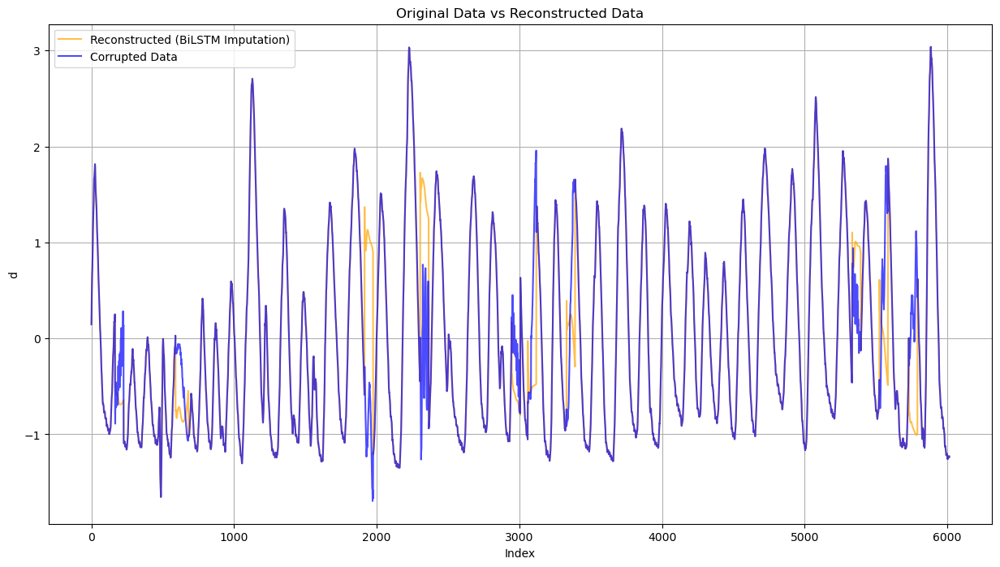

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import os

folder_path = 'Resting_cleaned'  # Folder path

# Load original data
file_original = os.path.join(folder_path, 'ID0003_10hz_missing_corrupt.csv')
df_original = pd.read_csv(file_original)

# Load missing data with mean imputation
file_missing = os.path.join(folder_path, 'ID0003_10hz_seq2seq_imputed.csv')
df_missing = pd.read_csv(file_missing)

# Plot both
plt.figure(figsize=(15, 8))

# Mean imputed missing data 'mean'
plt.plot(df_missing.index, df_missing['d'], label='Reconstructed (BiLSTM Imputation)', color='orange', alpha=0.7)

# Original data 'd'
plt.plot(df_original.index, df_original['d'], label='Corrupted Data', color='blue', alpha=0.7)


plt.xlabel('Index')
plt.ylabel('d')
plt.title('Original Data vs Reconstructed Data')
plt.legend()
plt.grid(True)
plt.show()


#### RF imputation

In [21]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import os

folder_path = 'Resting_cleaned'  # Folder path
sequence_length = 30             # CHANGED
max_iterations = 10


def create_sequences(data, seq_len):
    sequences = []
    for i in range(len(data) - seq_len + 1):
        sequences.append(data[i:i + seq_len])
    return np.array(sequences)


for filename in os.listdir(folder_path):
    if filename.endswith('_10hz_missing.csv'):
        print(f"Processing {filename} ...")
        file_path = os.path.join(folder_path, filename)
        df = pd.read_csv(file_path)

        scaler = MinMaxScaler(feature_range=(0, 1))
        df['d_scaled'] = scaler.fit_transform(df[['d']])

        # Prepare training data from available non-missing scaled data
        non_nan_data = df['d_scaled'].dropna().values
        if len(non_nan_data) < sequence_length:
            print(f"Not enough data in {filename} to create sequences, skipping.")
            continue

        X_full = create_sequences(non_nan_data, sequence_length)
        X_rf = X_full[:, :-1]   # first 29 as input
        y_rf = X_full[:, -1]    # last as target

        rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
        rf_model.fit(X_rf, y_rf)

        for iteration in range(max_iterations):
            missing_before = df['d'].isna().sum()

            # Impute missing points iteratively
            for i in range(len(df)):
                if pd.isna(df.at[i, 'd']):
                    past_vals = df['d_scaled'].iloc[max(0, i - sequence_length + 1):i].dropna().values
                    if len(past_vals) == 0:
                        continue

                    # pad to length sequence_length - 1 (29)
                    if len(past_vals) < sequence_length - 1:
                        past_vals = np.pad(
                            past_vals,
                            (sequence_length - 1 - len(past_vals), 0),
                            'constant',
                            constant_values=past_vals[0]
                        )

                    input_seq = np.reshape(past_vals, (1, sequence_length - 1))  # (1, 29)
                    pred_scaled = rf_model.predict(input_seq)
                    pred_value = scaler.inverse_transform(pred_scaled.reshape(-1, 1))[0][0]
                    df.at[i, 'd'] = pred_value
                    df.at[i, 'd_scaled'] = scaler.transform([[pred_value]])[0][0]

            missing_after = df['d'].isna().sum()
            print(f"Iteration {iteration + 1}: Missing values remaining = {missing_after}")
            if missing_after == 0 or missing_after == missing_before:
                # No improvement or fully imputed
                break

        df.drop(columns=['d_scaled'], inplace=True)
        output_filename = filename.replace('_10hz_missing.csv', '_10hz_rf_imputed.csv')
        output_path = os.path.join(folder_path, output_filename)
        df.to_csv(output_path, index=False)
        print(f"{output_filename} saved successfully!\n")


Processing ID0009_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0009_10hz_rf_imputed.csv saved successfully!

Processing ID0014_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0014_10hz_rf_imputed.csv saved successfully!

Processing ID0011_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0011_10hz_rf_imputed.csv saved successfully!

Processing ID0008_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0008_10hz_rf_imputed.csv saved successfully!

Processing ID0022_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0022_10hz_rf_imputed.csv saved successfully!

Processing ID0017_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0017_10hz_rf_imputed.csv saved successfully!

Processing ID0019_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0019_10hz_rf_imputed.csv saved successfully!

Processing ID0015_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0015_10hz_rf_imputed.csv saved successfully!

Processing ID0026_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0026_10hz_rf_imputed.csv saved successfully!

Processing ID0001_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0001_10hz_rf_imputed.csv saved successfully!

Processing ID0020_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0020_10hz_rf_imputed.csv saved successfully!

Processing ID0005_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0005_10hz_rf_imputed.csv saved successfully!

Processing ID0013_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0013_10hz_rf_imputed.csv saved successfully!

Processing ID0016_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0016_10hz_rf_imputed.csv saved successfully!

Processing ID0030_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0030_10hz_rf_imputed.csv saved successfully!

Processing ID0023_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0023_10hz_rf_imputed.csv saved successfully!

Processing ID0024_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0024_10hz_rf_imputed.csv saved successfully!

Processing ID0003_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0003_10hz_rf_imputed.csv saved successfully!

Processing ID0025_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0025_10hz_rf_imputed.csv saved successfully!

Processing ID0012_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0012_10hz_rf_imputed.csv saved successfully!

Processing ID0029_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0029_10hz_rf_imputed.csv saved successfully!

Processing ID0004_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0004_10hz_rf_imputed.csv saved successfully!

Processing ID0028_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0028_10hz_rf_imputed.csv saved successfully!

Processing ID0027_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0027_10hz_rf_imputed.csv saved successfully!

Processing ID0018_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0018_10hz_rf_imputed.csv saved successfully!

Processing ID0002_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0002_10hz_rf_imputed.csv saved successfully!

Processing ID0007_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0007_10hz_rf_imputed.csv saved successfully!

Processing ID0021_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0021_10hz_rf_imputed.csv saved successfully!

Processing ID0006_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0006_10hz_rf_imputed.csv saved successfully!

Processing ID0010_10hz_missing.csv ...


/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

Iteration 1: Missing values remaining = 0
ID0010_10hz_rf_imputed.csv saved successfully!



/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/home/AiTeam/HakobG/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature nam

#### RF plot

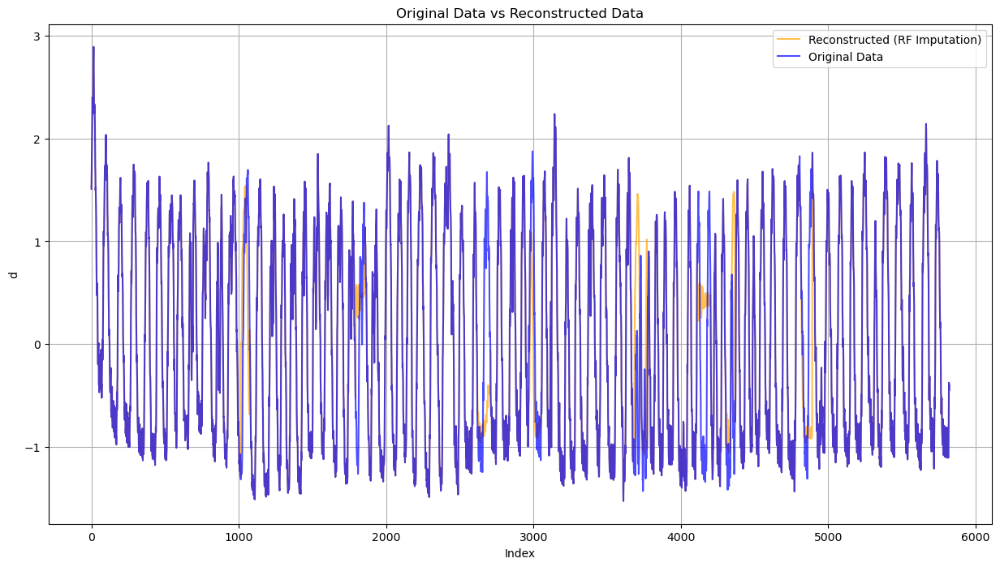

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import os

folder_path = 'Resting_cleaned'  # Folder path

# Load original data
file_original = os.path.join(folder_path, 'ID0001_10hz.csv')
df_original = pd.read_csv(file_original)

# Load missing data with mean imputation
file_missing = os.path.join(folder_path, 'ID0001_10hz_rf_imputed.csv')
df_missing = pd.read_csv(file_missing)

# Plot both
plt.figure(figsize=(15, 8))

# Mean imputed missing data 'mean'
plt.plot(df_missing.index, df_missing['d'], label='Reconstructed (RF Imputation)', color='orange', alpha=0.7)

# Original data 'd'
plt.plot(df_original.index, df_original['d'], label='Original Data', color='blue', alpha=0.7)


plt.xlabel('Index')
plt.ylabel('d')
plt.title('Original Data vs Reconstructed Data')
plt.legend()
plt.grid(True)
plt.show()


#### Evaluation

,RMSE,MAE
Method,,
Corrupted Data,0.401964,0.104177
RF Imputation,0.359266,0.087448
LSTM Imputation,0.507070,0.121744
BiLSTM Imputation,0.425399,0.111222
BiLSTM Improved version,0.383561,0.098991
BiLSTM Seq2Seq (Improved model),0.346961,0.095171
Mean Imputation,0.335904,0.094000


Corrupted Data: RMSE=0.401964, MAE=0.104177
RF Imputation: RMSE=0.359266, MAE=0.087448
LSTM Imputation: RMSE=0.507070, MAE=0.121744
BiLSTM Imputation: RMSE=0.425399, MAE=0.111222
BiLSTM Improved version: RMSE=0.383561, MAE=0.098991
BiLSTM Seq2Seq (Improved model): RMSE=0.346961, MAE=0.095171
Mean Imputation: RMSE=0.335904, MAE=0.094000


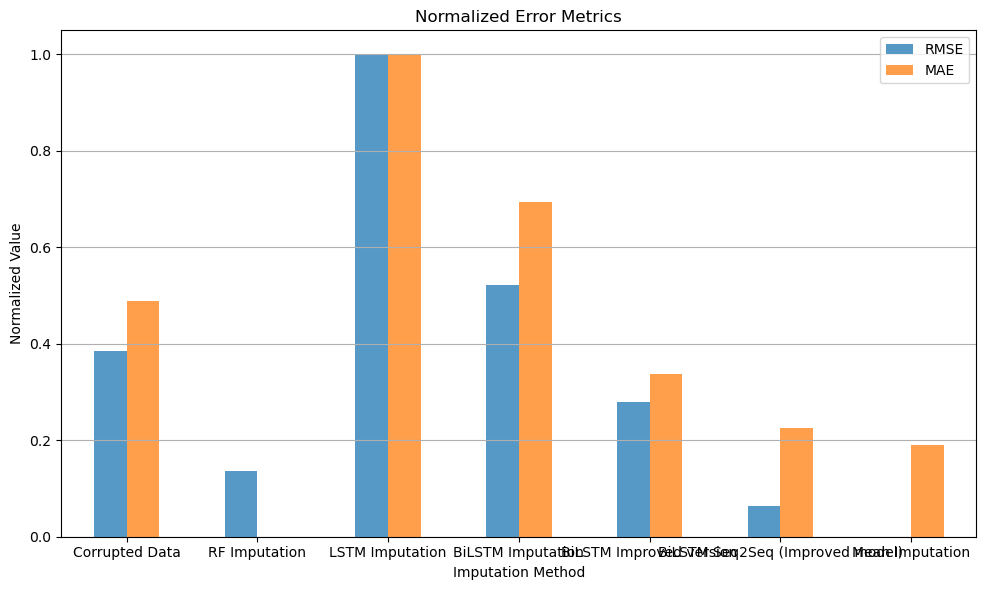

In [6]:
import os
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt

folder_path = "Resting_cleaned"


def calculate_metrics(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    return rmse, mae


# --------------------------------------------------------
# File groups
# --------------------------------------------------------
files_original = {}
files_corrupt = {}
files_rf = {}
files_lstm = {}
files_bilstm = {}
files_bilstm_gaps = {}
files_seq2seq = {}              # ★ NEW MODEL
files_mean = {}

for filename in os.listdir(folder_path):

    # Original clean
    if filename.endswith("_10hz.csv") and not filename.endswith(
        (
            "_10hz_missing_corrupt.csv",
            "_10hz_rf_imputed.csv",
            "_10hz_lstm.csv",
            "_10hz_bilstm.csv",
            "_10hz_bilstm_gaps60_90.csv",
            "_10hz_seq2seq_imputed.csv",    # ★ Added new model file
            "_10hz_reconstructed_mean.csv",
        )
    ):
        idp = filename.split("_10hz")[0]
        files_original[idp] = filename

    # Corrupted
    elif filename.endswith("_10hz_missing_corrupt.csv"):
        idp = filename.split("_10hz")[0]
        files_corrupt[idp] = filename

    # RF
    elif filename.endswith("_10hz_rf_imputed.csv"):
        idp = filename.split("_10hz")[0]
        files_rf[idp] = filename

    # LSTM
    elif filename.endswith("_10hz_lstm.csv"):
        idp = filename.split("_10hz")[0]
        files_lstm[idp] = filename

    # BiLSTM old
    elif filename.endswith("_10hz_bilstm.csv"):
        idp = filename.split("_10hz")[0]
        files_bilstm[idp] = filename

    # BiLSTM improved (gaps 60/90)
    elif filename.endswith("_10hz_bilstm_gaps60_90.csv"):
        idp = filename.split("_10hz")[0]
        files_bilstm_gaps[idp] = filename

    # Seq2Seq ★ NEW MODEL
    elif filename.endswith("_10hz_seq2seq_imputed.csv"):
        idp = filename.split("_10hz")[0]
        files_seq2seq[idp] = filename

    # Mean
    elif filename.endswith("_10hz_reconstructed_mean.csv"):
        idp = filename.split("_10hz")[0]
        files_mean[idp] = filename


# --------------------------------------------------------
# ID sets
# --------------------------------------------------------
ids = set(files_original.keys())
ids_corrupt = ids.intersection(files_corrupt)
ids_rf = ids.intersection(files_rf)
ids_lstm = ids.intersection(files_lstm)
ids_bilstm = ids.intersection(files_bilstm)
ids_bilstm_gaps = ids.intersection(files_bilstm_gaps)
ids_seq2seq = ids.intersection(files_seq2seq)    # ★ NEW
ids_mean = ids.intersection(files_mean)

# --------------------------------------------------------
# Metric accumulators
# --------------------------------------------------------
metrics_corrupt = []
metrics_rf = []
metrics_lstm = []
metrics_bilstm = []
metrics_bilstm_gaps = []
metrics_seq2seq = []            # ★ NEW
metrics_mean = []


# --------------------------------------------------------
# Compute metrics
# --------------------------------------------------------
for idp in ids:

    # Ground truth
    df_orig = pd.read_csv(os.path.join(folder_path, files_original[idp]))
    y_true = df_orig["d"].values

    # Corrupted
    if idp in ids_corrupt:
        df = pd.read_csv(os.path.join(folder_path, files_corrupt[idp]))
        metrics_corrupt.append(calculate_metrics(y_true, df["d"].values))

    # RF
    if idp in ids_rf:
        df = pd.read_csv(os.path.join(folder_path, files_rf[idp]))
        metrics_rf.append(calculate_metrics(y_true, df["d"].values))

    # LSTM
    if idp in ids_lstm:
        df = pd.read_csv(os.path.join(folder_path, files_lstm[idp]))
        metrics_lstm.append(calculate_metrics(y_true, df["d"].values))

    # BiLSTM old
    if idp in ids_bilstm:
        df = pd.read_csv(os.path.join(folder_path, files_bilstm[idp]))
        metrics_bilstm.append(calculate_metrics(y_true, df["d"].values))

    # BiLSTM improved
    if idp in ids_bilstm_gaps:
        df = pd.read_csv(os.path.join(folder_path, files_bilstm_gaps[idp]))
        metrics_bilstm_gaps.append(calculate_metrics(y_true, df["d"].values))

    # Seq2Seq ★ NEW MODEL
    if idp in ids_seq2seq:
        df = pd.read_csv(os.path.join(folder_path, files_seq2seq[idp]))
        metrics_seq2seq.append(calculate_metrics(y_true, df["d"].values))

    # Mean
    if idp in ids_mean:
        df = pd.read_csv(os.path.join(folder_path, files_mean[idp]))
        metrics_mean.append(calculate_metrics(y_true, df["mean"].values))


# --------------------------------------------------------
# Averages
# --------------------------------------------------------
def avg(metrics):
    if not metrics:
        return (np.nan, np.nan)
    rmse = np.mean([x[0] for x in metrics])
    mae  = np.mean([x[1] for x in metrics])
    return rmse, mae


avg_corrupt = avg(metrics_corrupt)
avg_rf = avg(metrics_rf)
avg_lstm = avg(metrics_lstm)
avg_bilstm = avg(metrics_bilstm)
avg_bilstm_gaps = avg(metrics_bilstm_gaps)
avg_seq2seq = avg(metrics_seq2seq)     # ★ NEW
avg_mean = avg(metrics_mean)


# --------------------------------------------------------
# Final table
# --------------------------------------------------------
metrics_df = pd.DataFrame({
    "Method": [
        "Corrupted Data",
        "RF Imputation",
        "LSTM Imputation",
        "BiLSTM Imputation",
        "BiLSTM Improved version",
        "BiLSTM Seq2Seq (Improved model)",        # ★ NEW
        "Mean Imputation",
    ],
    "RMSE": [
        avg_corrupt[0],
        avg_rf[0],
        avg_lstm[0],
        avg_bilstm[0],
        avg_bilstm_gaps[0],
        avg_seq2seq[0],                    # ★ NEW
        avg_mean[0],
    ],
    "MAE": [
        avg_corrupt[1],
        avg_rf[1],
        avg_lstm[1],
        avg_bilstm[1],
        avg_bilstm_gaps[1],
        avg_seq2seq[1],                    # ★ NEW
        avg_mean[1],
    ]
}).set_index("Method")


def highlight_min(s):
    is_min = s == s.min()
    return ["background-color: red" if v else "" for v in is_min]


try:
    display(metrics_df.style.apply(highlight_min, axis=0))
except:
    print(metrics_df)


for method in metrics_df.index:
    print(f"{method}: RMSE={metrics_df.loc[method,'RMSE']:.6f}, "
          f"MAE={metrics_df.loc[method,'MAE']:.6f}")


# --------------------------------------------------------
# Plot normalized metrics
# --------------------------------------------------------
metrics_norm = (metrics_df - metrics_df.min()) / (metrics_df.max() - metrics_df.min())

metrics_norm.plot(kind="bar", figsize=(10, 6), alpha=0.75)
plt.title("Normalized Error Metrics")
plt.xlabel("Imputation Method")
plt.ylabel("Normalized Value")
plt.xticks(rotation=0)
plt.grid(axis="y")
plt.tight_layout()
plt.show()


#### FINAL EVALUATION

,RMSE,MAE
Method,,
Corrupted Data,0.401964,0.104177
RF Imputation,0.359266,0.087448
LSTM Imputation,0.507070,0.121744
Seq2Seq BiLSTM (Improved Model),0.346961,0.095171


Corrupted Data: RMSE=0.401964, MAE=0.104177
RF Imputation: RMSE=0.359266, MAE=0.087448
LSTM Imputation: RMSE=0.507070, MAE=0.121744
Seq2Seq BiLSTM (Improved Model): RMSE=0.346961, MAE=0.095171


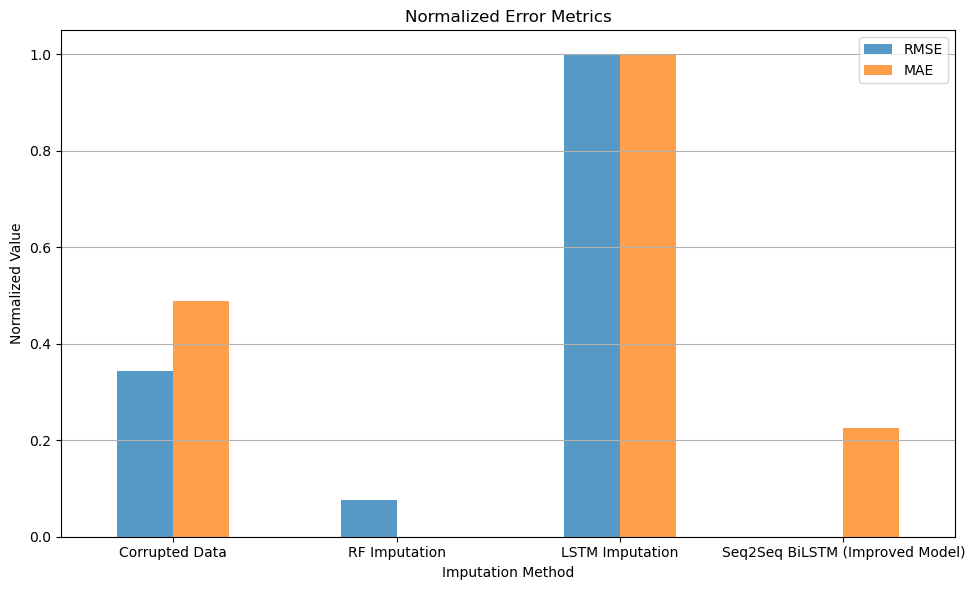

In [5]:
import os
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt

folder_path = "Resting_cleaned"


def calculate_metrics(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    return rmse, mae


# --------------------------------------------------------
# File groups (only keep needed models)
# --------------------------------------------------------
files_original = {}
files_corrupt = {}
files_rf = {}
files_lstm = {}
files_seq2seq = {}   # ★ NEW MODEL ONLY


for filename in os.listdir(folder_path):

    # Original clean
    if filename.endswith("_10hz.csv") and not filename.endswith(
        (
            "_10hz_missing_corrupt.csv",
            "_10hz_rf_imputed.csv",
            "_10hz_lstm.csv",
            "_10hz_seq2seq_imputed.csv",
        )
    ):
        idp = filename.split("_10hz")[0]
        files_original[idp] = filename

    # Corrupted
    elif filename.endswith("_10hz_missing_corrupt.csv"):
        idp = filename.split("_10hz")[0]
        files_corrupt[idp] = filename

    # RF
    elif filename.endswith("_10hz_rf_imputed.csv"):
        idp = filename.split("_10hz")[0]
        files_rf[idp] = filename

    # LSTM
    elif filename.endswith("_10hz_lstm.csv"):
        idp = filename.split("_10hz")[0]
        files_lstm[idp] = filename

    # Seq2Seq ★ NEW MODEL
    elif filename.endswith("_10hz_seq2seq_imputed.csv"):
        idp = filename.split("_10hz")[0]
        files_seq2seq[idp] = filename


# --------------------------------------------------------
# ID sets
# --------------------------------------------------------
ids = set(files_original.keys())
ids_corrupt = ids.intersection(files_corrupt)
ids_rf = ids.intersection(files_rf)
ids_lstm = ids.intersection(files_lstm)
ids_seq2seq = ids.intersection(files_seq2seq)


# --------------------------------------------------------
# Metric accumulators
# --------------------------------------------------------
metrics_corrupt = []
metrics_rf = []
metrics_lstm = []
metrics_seq2seq = []


# --------------------------------------------------------
# Compute metrics
# --------------------------------------------------------
for idp in ids:

    df_orig = pd.read_csv(os.path.join(folder_path, files_original[idp]))
    y_true = df_orig["d"].values

    # Corrupted
    if idp in ids_corrupt:
        df = pd.read_csv(os.path.join(folder_path, files_corrupt[idp]))
        metrics_corrupt.append(calculate_metrics(y_true, df["d"].values))

    # RF
    if idp in ids_rf:
        df = pd.read_csv(os.path.join(folder_path, files_rf[idp]))
        metrics_rf.append(calculate_metrics(y_true, df["d"].values))

    # LSTM
    if idp in ids_lstm:
        df = pd.read_csv(os.path.join(folder_path, files_lstm[idp]))
        metrics_lstm.append(calculate_metrics(y_true, df["d"].values))

    # Seq2Seq
    if idp in ids_seq2seq:
        df = pd.read_csv(os.path.join(folder_path, files_seq2seq[idp]))
        metrics_seq2seq.append(calculate_metrics(y_true, df["d"].values))


# --------------------------------------------------------
# Averages
# --------------------------------------------------------
def avg(metrics):
    if not metrics:
        return (np.nan, np.nan)
    rmse = np.mean([x[0] for x in metrics])
    mae  = np.mean([x[1] for x in metrics])
    return rmse, mae


avg_corrupt = avg(metrics_corrupt)
avg_rf = avg(metrics_rf)
avg_lstm = avg(metrics_lstm)
avg_seq2seq = avg(metrics_seq2seq)


# --------------------------------------------------------
# Final table
# --------------------------------------------------------
metrics_df = pd.DataFrame({
    "Method": [
        "Corrupted Data",
        "RF Imputation",
        "LSTM Imputation",
        "Seq2Seq BiLSTM (Improved Model)"
    ],
    "RMSE": [
        avg_corrupt[0],
        avg_rf[0],
        avg_lstm[0],
        avg_seq2seq[0]
    ],
    "MAE": [
        avg_corrupt[1],
        avg_rf[1],
        avg_lstm[1],
        avg_seq2seq[1]
    ]
}).set_index("Method")


def highlight_min(s):
    return ["background-color: red" if v else "" for v in (s == s.min())]


try:
    display(metrics_df.style.apply(highlight_min, axis=0))
except:
    print(metrics_df)


for method in metrics_df.index:
    print(f"{method}: RMSE={metrics_df.loc[method,'RMSE']:.6f}, "
          f"MAE={metrics_df.loc[method,'MAE']:.6f}")


# --------------------------------------------------------
# Plot normalized metrics
# --------------------------------------------------------
metrics_norm = (metrics_df - metrics_df.min()) / (metrics_df.max() - metrics_df.min())

metrics_norm.plot(kind="bar", figsize=(10, 6), alpha=0.75)
plt.title("Normalized Error Metrics")
plt.xlabel("Imputation Method")
plt.ylabel("Normalized Value")
plt.xticks(rotation=0)
plt.grid(axis="y")
plt.tight_layout()
plt.show()
